# **1. Setup e imports**

In [4]:
%run notebook_setup.py

# garante que todos os módulos importados sejam recarregados automaticamente antes de cada execução de célula.
%load_ext autoreload
# O número 2 significa: Recarregue automaticamente todos os módulos importados antes da execução de qualquer célula.
%autoreload 2

[INFO] src adicionado ao sys.path: /home/ilfn/datascience/workspace/projeto_analise_series_temporais/src


In [2]:
# !pip install "numpy>=1.22,<1.26" "scipy<1.16" "pmdarima==2.0.4"

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import statsmodels.tsa.api as smt

import pmdarima as pm
from pmdarima import utils
from pmdarima.pipeline import Pipeline

from pathlib import Path

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', np.RankWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# from backend.preprocessing import aplicar_log, diferenciar, reverter_transformacoes
from backend.stats_tests import teste_adf
from backend.preprocessing import split_series_treino_teste
from backend.visualization import (
    plot_acf_pacf, plot_annual_trend, 
    plot_full_time_series, plot_train_test_split
)

from backend.residuals import (
    calc_residuo_mm, plot_mm_e_residuo,
    calc_residuo_ewm, plot_ewm_e_residuo
)

from backend.arima_model import (
    rodar_modelo_arima
)



In [6]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6

# **2. Carregamento dos Dados**

Nesta etapa inicial, será realizado o carregamento do dataset a partir de um arquivo CSV.

O dataset contém informações sobre o índice **IPG2211A2N** [FRED – Federal Reserve Bank of St. Louis](https://fred.stlouisfed.org/series/IPG2211A2N) que representa a **Produção Industrial do setor de eletricidade e gás (Electric and Gas Utilities) nos Estados Unidos**.

Principais características do índice:
- É um índice de produção industrial, com ano-base em 2017 = 100.
- Mede a produção real das empresas de eletricidade e gás nos EUA.
- É uma série temporal mensal, não ajustada sazonalmente (Not Seasonally Adjusted)

A base de dados é composta por duas colunas principais:
- **Data**: representa o período de observação, em formato de data.
- **Índice (IPG2211A2N)**: ariável numérica que expressa o nível de produção de eletricidade e gás nos EUA, em relação ao ano de referência (2017 = 100).

In [7]:
caminho_dataset = Path('../data/raw/IPG2211A2N.csv')

df = pd.read_csv(caminho_dataset, header=0)
df['observation_date'] = pd.to_datetime(df['observation_date']) # Converte a coluna Month para datetime.

# Define Month como índice do DataFrame (e remove a coluna original com drop=True).
# Isso é importante para que funções de séries temporais reconheçam a frequência.
df.set_index('observation_date', drop=True, inplace=True)

titulo_da_serie = "Produção Industrial de Eletricidade e Gás nos EUA"
coluna_numerica = "IPG2211A2N" # coluna com o valor numérico da série

In [6]:
df

,IPG2211A2N
observation_date,
1939-01-01,3.3336
1939-02-01,3.3591
1939-03-01,3.4354
1939-04-01,3.4608
1939-05-01,3.4608
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


# **3. Visualizar a série**

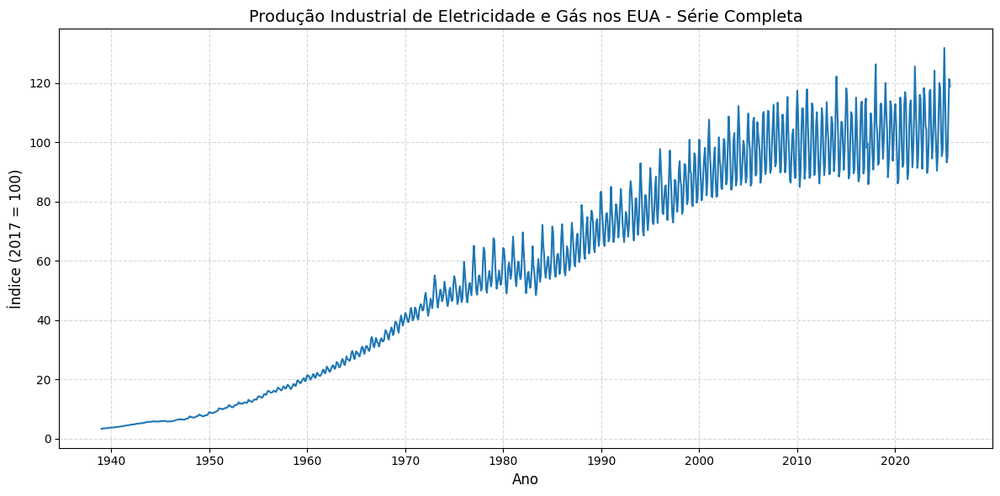

In [7]:
plot_full_time_series(
    df[[coluna_numerica]],
    title=f"{titulo_da_serie} - Série Completa",
    xlabel="Ano",
    ylabel="Índice (2017 = 100)"
)


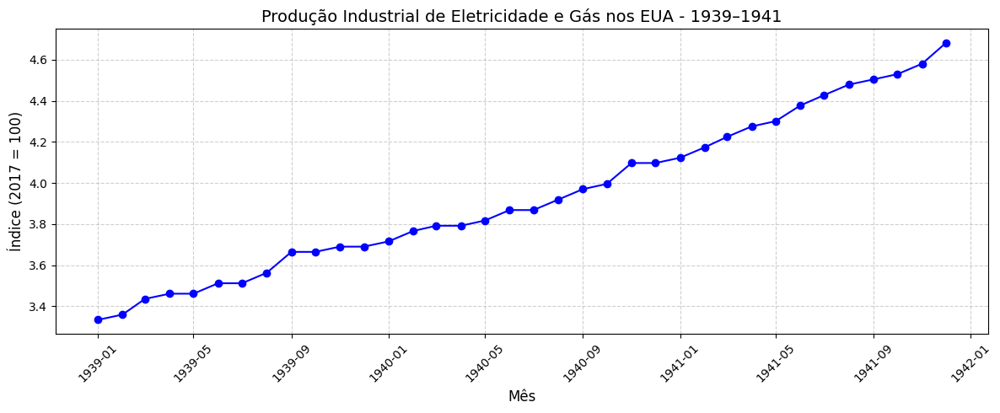

In [8]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(1939,1941),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

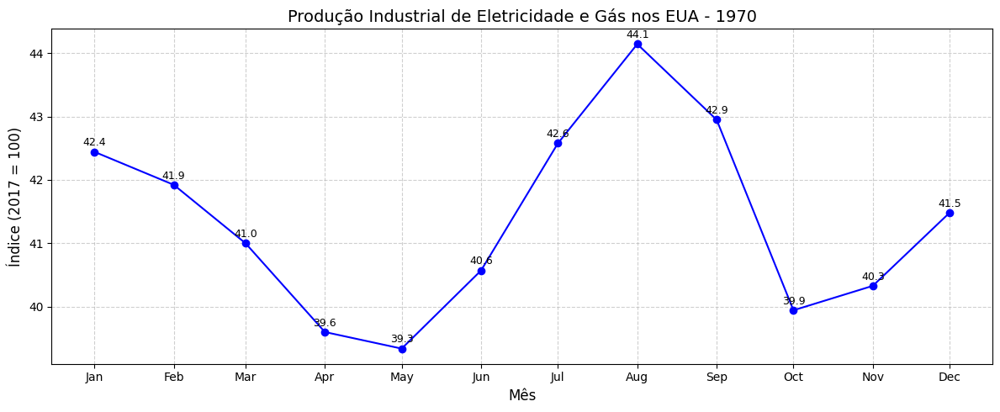

In [9]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(1970),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

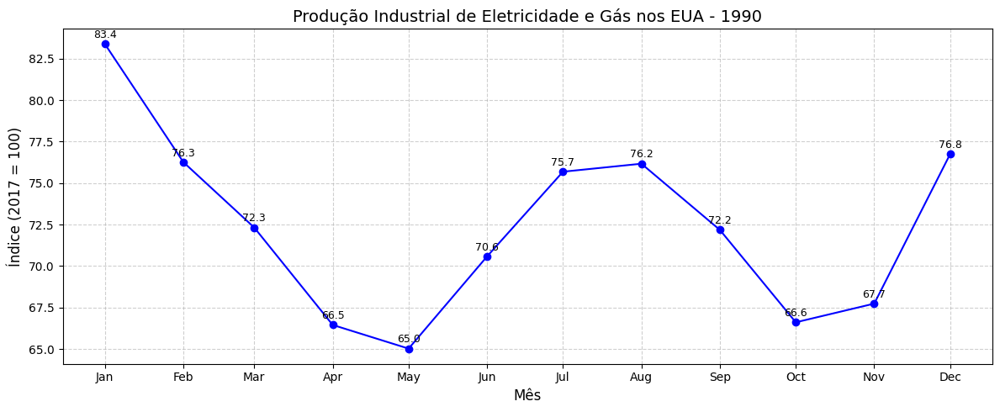

In [10]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=1990,
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

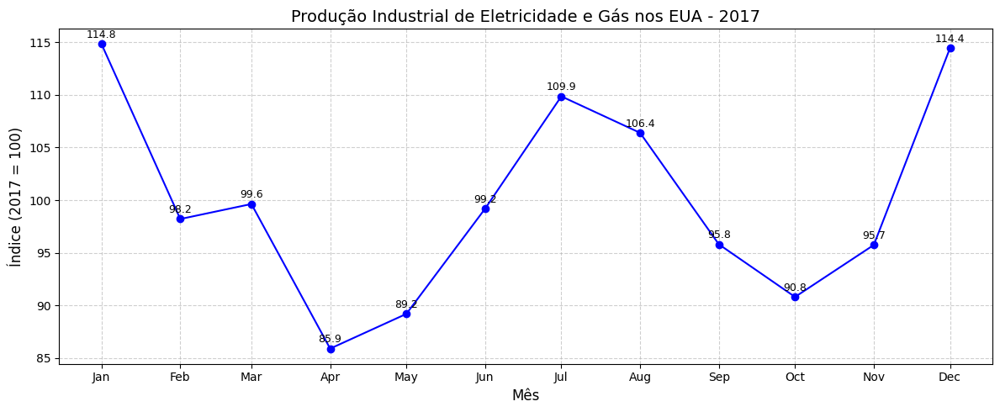

In [11]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=2017,
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

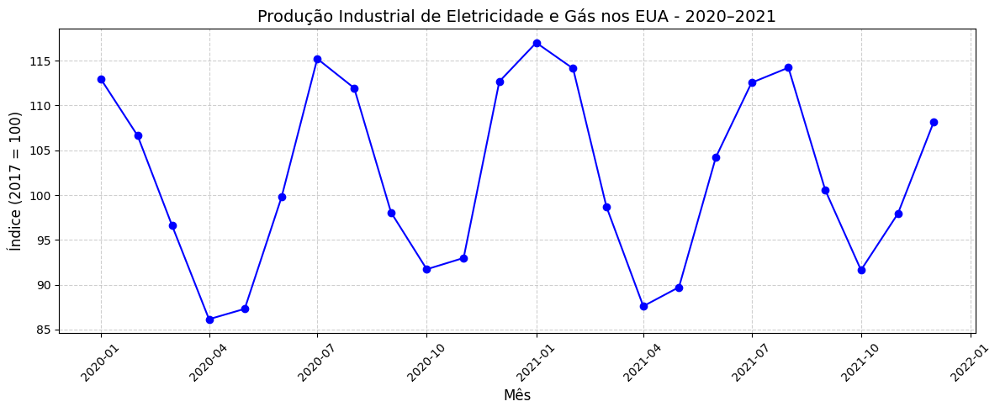

In [12]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(2020, 2021),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

## **3.1. Visualizar os componentes da série**

Aqui a decomposição foi feita com a biblioteca `pmdarima`

Text(0.5, 1.0, 'Produção Industrial de Eletricidade e Gás nos EUA - Decomposição da Série')

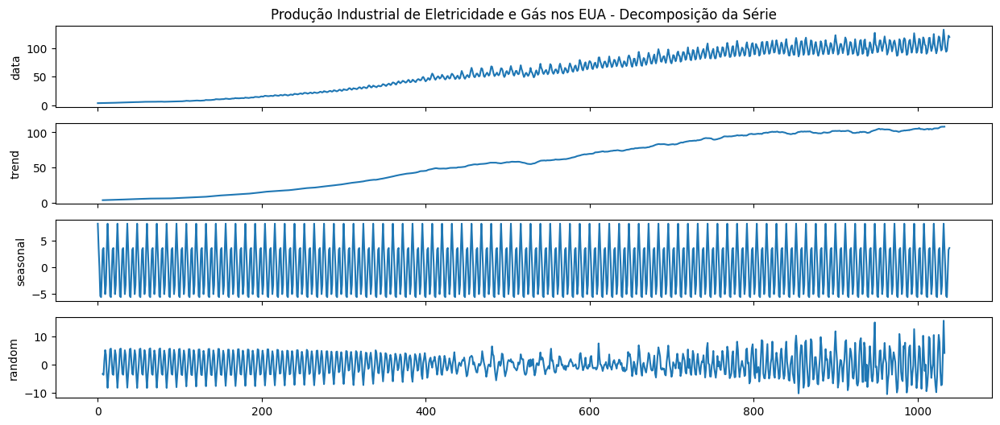

In [13]:
figure_kwargs = {'figsize': (15, 6)}  #
# Decompose the airpassengers dataset into trend, seasonal and random parts.
decomposed = pm.decompose(df.values.reshape(-1),
                             'additive', m=12)

# Plot the decomposed signal of airpassengers as a subplot

axes = utils.decomposed_plot(decomposed, figure_kwargs=figure_kwargs,
                             show=False)
axes[0].set_title(f"{titulo_da_serie} - Decomposição da Série")

<span style="color:#FFD700;">**OBSERVAÇÃO**</span>: Já é possível observar que a série tem **tendência** e **sazonalidade**, mas ainda é preciso testar a estacionariedade da série.

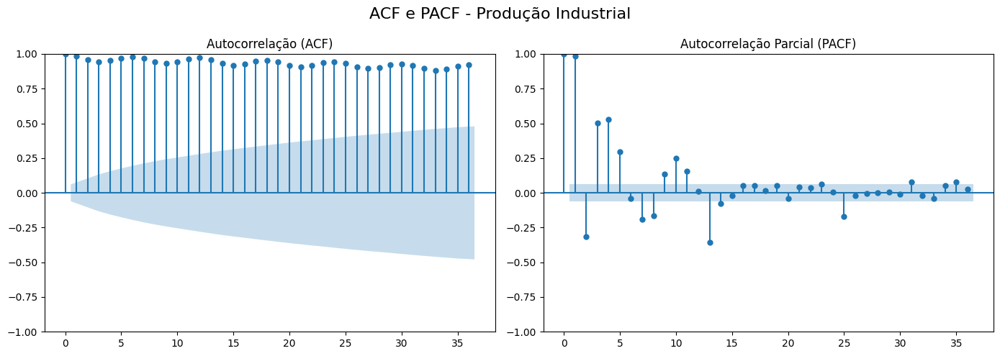

In [14]:
plot_acf_pacf(df[coluna_numerica], lags=36, title="ACF e PACF - Produção Industrial")

In [8]:
df_2000_to_2025 = df.loc['2000':]
df_2000_to_2025

,IPG2211A2N
observation_date,
2000-01-01,100.9655
2000-02-01,93.1095
2000-03-01,87.0262
2000-04-01,80.4459
2000-05-01,83.4576
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


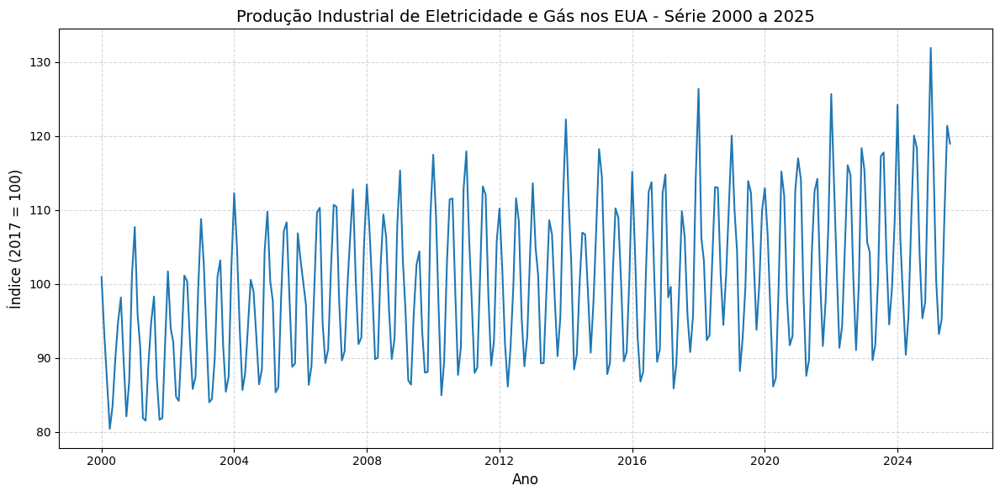

In [16]:
plot_full_time_series(
    df_2000_to_2025[[coluna_numerica]],
    title=f"{titulo_da_serie} - Série 2000 a 2025",
    xlabel="Ano",
    ylabel="Índice (2017 = 100)"
)


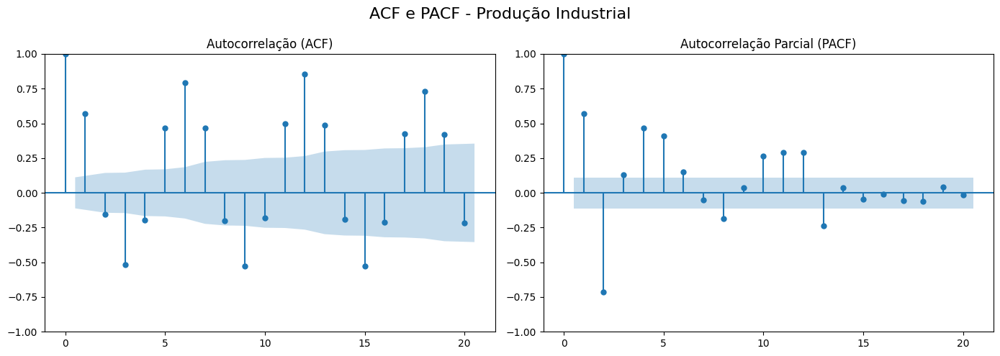

In [17]:
plot_acf_pacf(df_2000_to_2025[coluna_numerica], lags=20, title="ACF e PACF - Produção Industrial")

In [9]:
caminho_dataset = Path('../data/processed/IPG2211A2N_2000_to_2025.csv')


df_2000_to_2025_resetado = df_2000_to_2025.reset_index()


df_2000_to_2025_resetado.to_csv(caminho_dataset, index=False)

# **4. Testar a estacionariedade da série**

Uma série temporal é estacionária se suas propriedades estatísticas (média, variância e autocorrelação) não mudam ao longo do tempo.

Uma `série temporal estacionária `
- Não possui tendência 
- Nem sazonalidade

**Aplicar o teste de Dickey-Fuller**

In [10]:
resultado = teste_adf(df_2000_to_2025)

Série NÃO é estacionária (p-valor=0.6081)
ADF Statistic: -1.345478696239798
Critical Values:
	1%: -3.453
	5%: -2.872
	10%: -2.572


<span style="color:#FFD700;">**RESULTADO**</span>: Como a série <span style="color:red;">**não**</span> é estacionária, não poderíamos utilizar modelos clássicos como **AR**, **MA**, **ARMA** diretamente, pois exigem que a série a ser modelada seja **estacionária** (média, variância e autocorrelação constantes ao longo do tempo).

É necessário realizar o tratamento da série a fim de torná-la **estacionária**.
- **Eliminar tendência**:
    - Média móvel
    - Suavização Exponencial
    - Suavização Polinomial
    - Diferenciação


# **5. Modelagem (AR, MA, ARIMA) sem a eliminação de tendência e sazonalidade**

## **5.1. Dividir os dados em treinamento e teste**

Série com 308 registros dividida em:
Treino (75%): 231
Teste (25%): 77


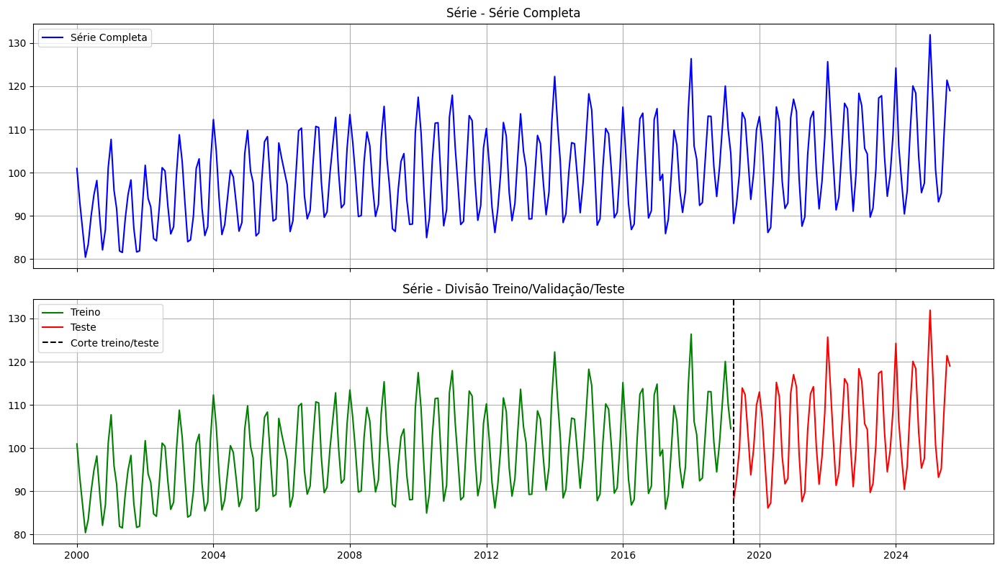

In [11]:
# Sem validação
y_train, y_test = split_series_treino_teste(df_2000_to_2025, percentual_treino=0.75)

plot_train_test_split(df_2000_to_2025, y_train, y_test)

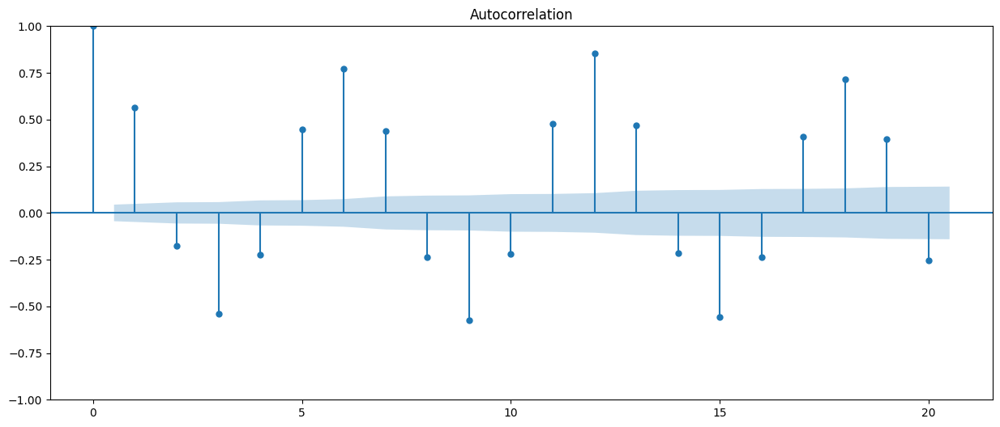

In [21]:
smt.graphics.plot_acf(y_train, lags=20, alpha=0.5)
plt.show()

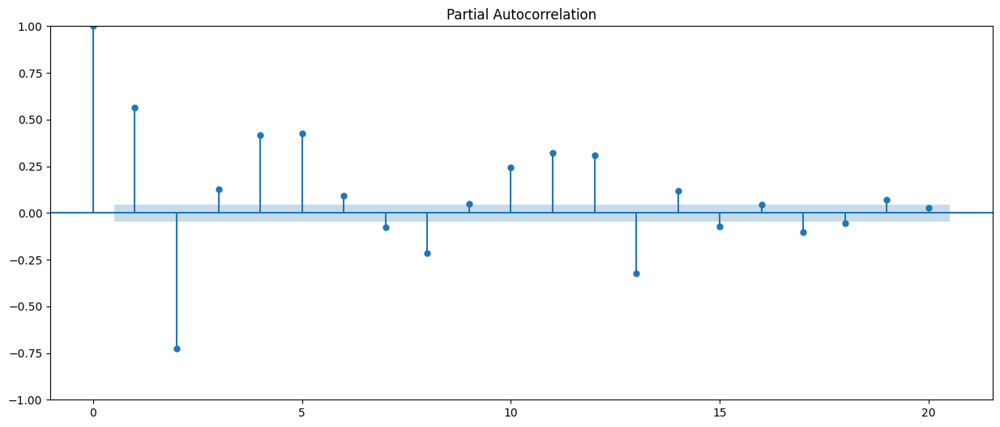

In [22]:
smt.graphics.plot_pacf(y_train, lags=20, alpha=0.5)
plt.show()

## **5.2. Aplicar o modelo**

Embora se saiba que a série em questão não é estacionária, o que inviabiliza o uso adequado de modelos puramente AR (Auto-Regressivo), MA (Médias Móveis) e ARMA (Auto-Regressivo com Médias Móveis), esses modelos foram ainda assim aplicados.

O objetivo da execução foi ilustrar como esses modelos se comportam diante de uma série não-estacionária.

### **5.2.1. Modelo AR**

#### **5.2.1.1. AR(2)**

Rodando AR(2) com order=(2, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


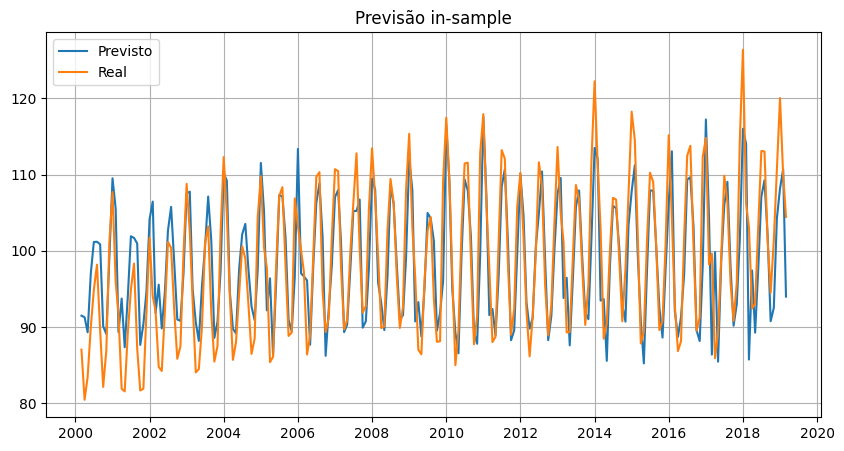


Etapa 3 - Análise de Resíduos In-Sample


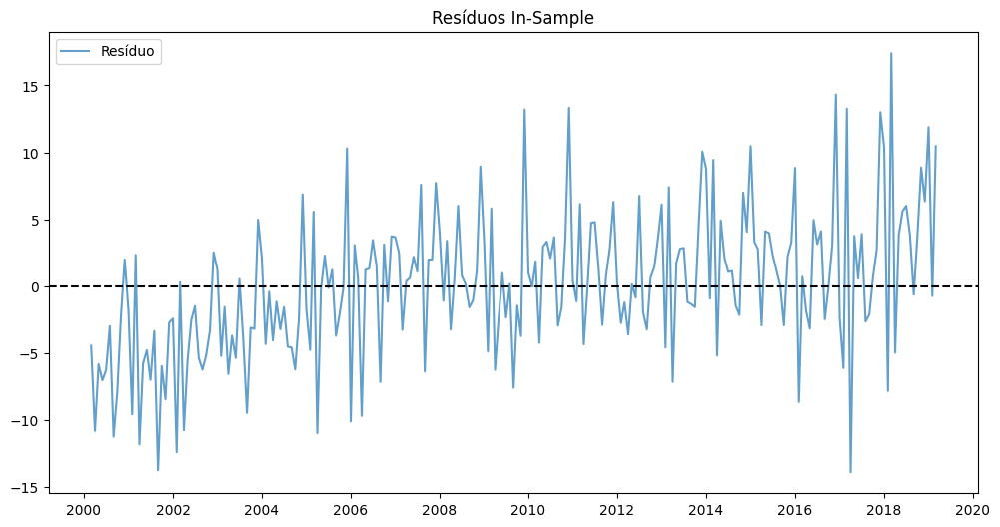

Média: 0.0025, Desvio-padrão: 5.4348

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=105.5538, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=262.4981, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

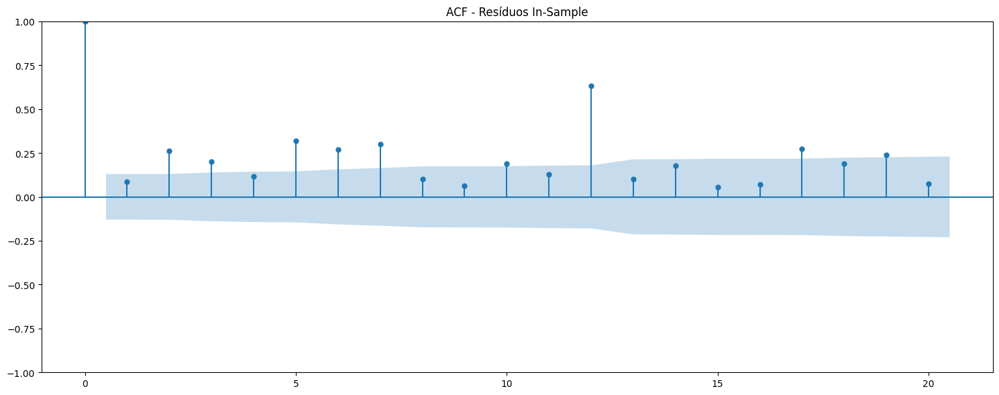


Etapa 4 - Previsões Out-of-Sample


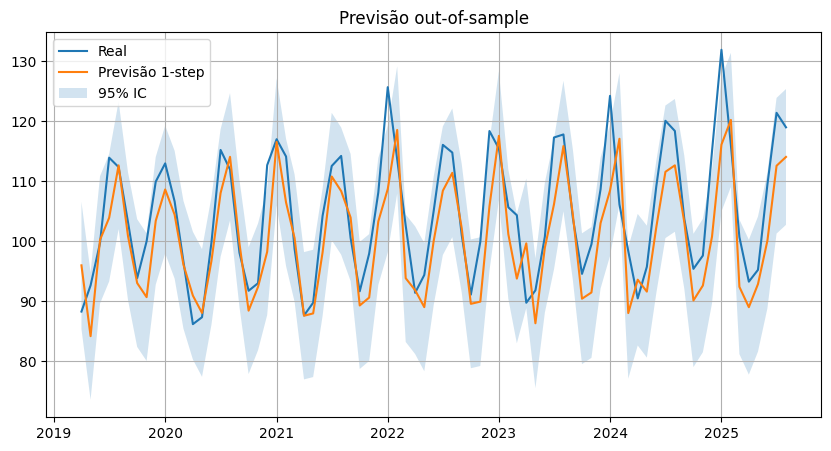


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 5.5359
MAPE: 0.0517
MSE: 47.8051

Etapa 6 - Análise de Resíduos Out-of-Sample


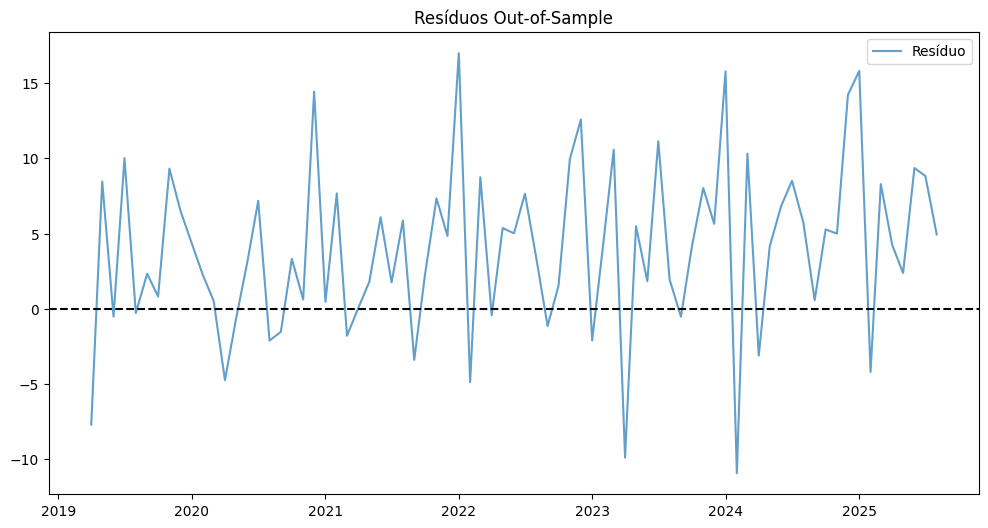

Média: 3.9725, Desvio-padrão: 5.6961

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=19.2150, p-valor=0.0376 → Autocorrelação detectada
Lag 20: estatística=37.9482, p-valor=0.0090 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

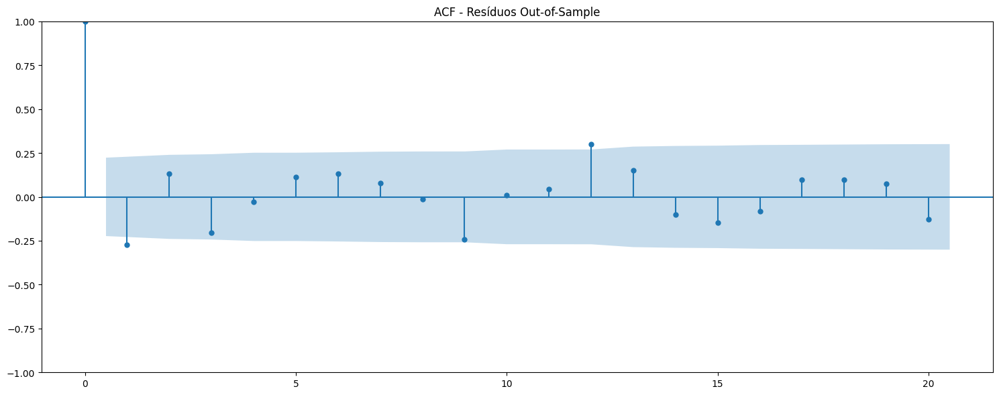


Pipeline finalizado!
Tempo total de execução: 0.48 minutos


In [23]:
resultado_ar_2 = rodar_modelo_arima(y_train, y_test, order=(2,0,0), nome_modelo="AR(2)")

#### **5.2.1.2. AR(6)**

Rodando AR(6) com order=(6, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


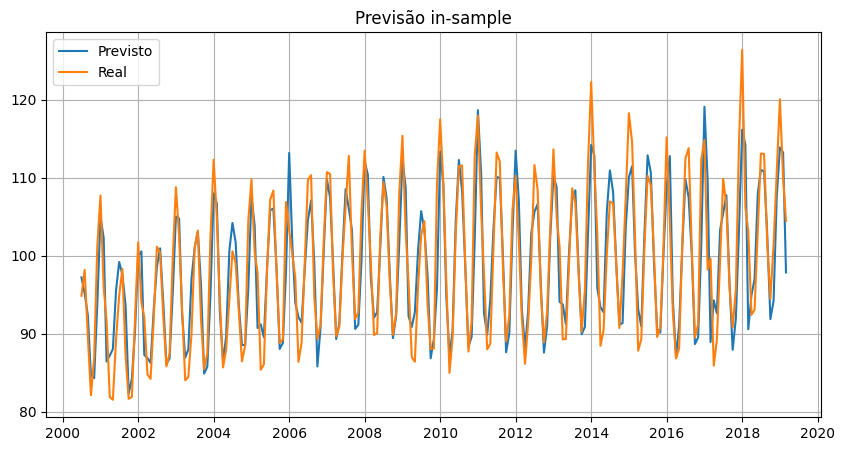


Etapa 3 - Análise de Resíduos In-Sample


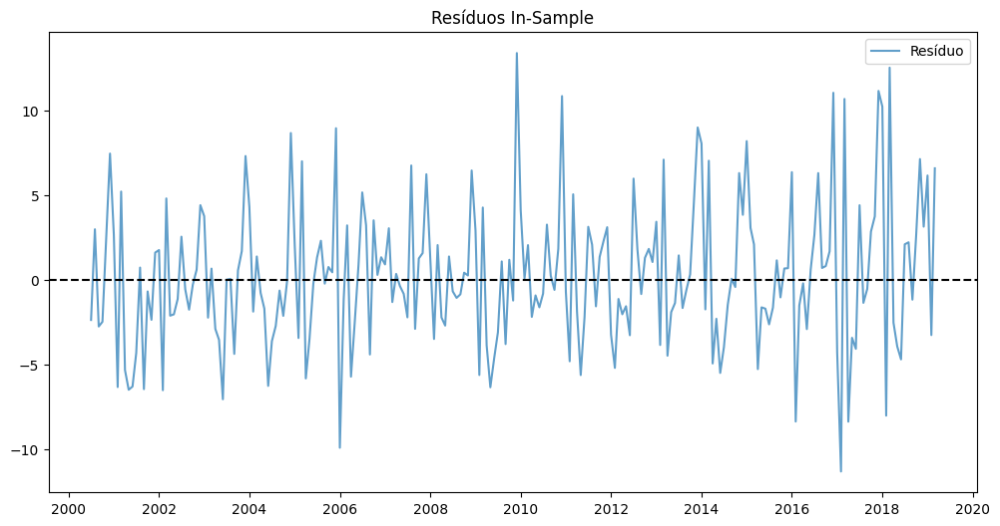

Média: 0.2416, Desvio-padrão: 4.2632

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=41.3657, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=117.9713, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

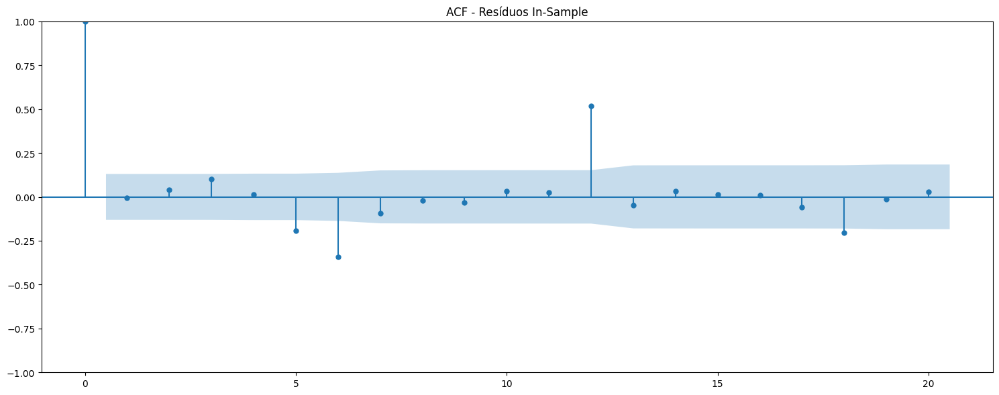


Etapa 4 - Previsões Out-of-Sample


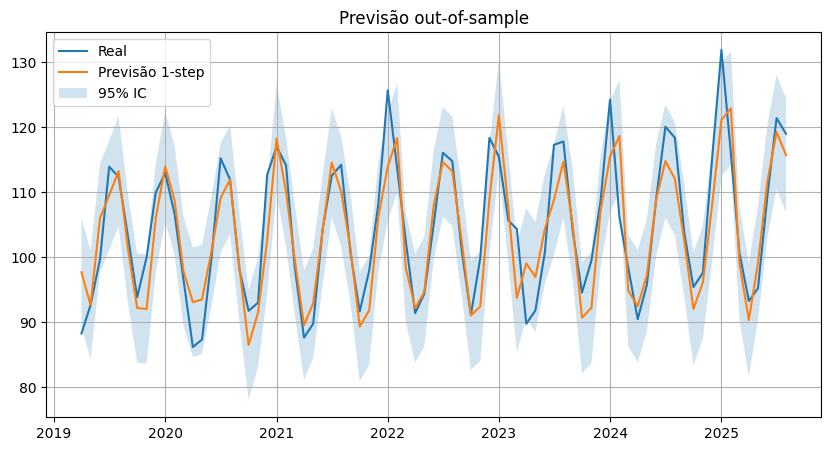


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.9246
MAPE: 0.0373
MSE: 25.5289

Etapa 6 - Análise de Resíduos Out-of-Sample


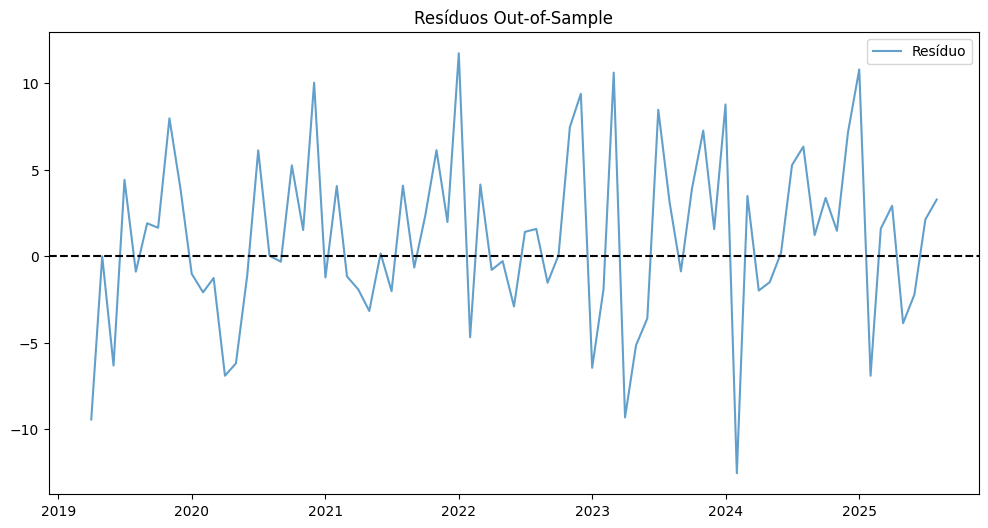

Média: 1.0164, Desvio-padrão: 4.9818

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=16.3077, p-valor=0.0912 → Sem autocorrelação
Lag 20: estatística=39.1292, p-valor=0.0064 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

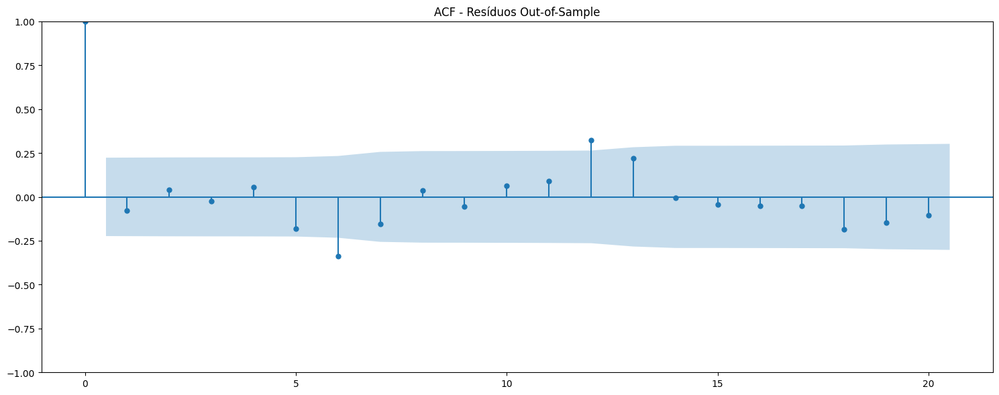


Pipeline finalizado!
Tempo total de execução: 0.71 minutos


In [24]:
resultado_ar_6 = rodar_modelo_arima(y_train, y_test, order=(6,0,0), nome_modelo="AR(6)")

#### **5.2.1.3. AR(12)**

Rodando AR(12) com order=(12, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


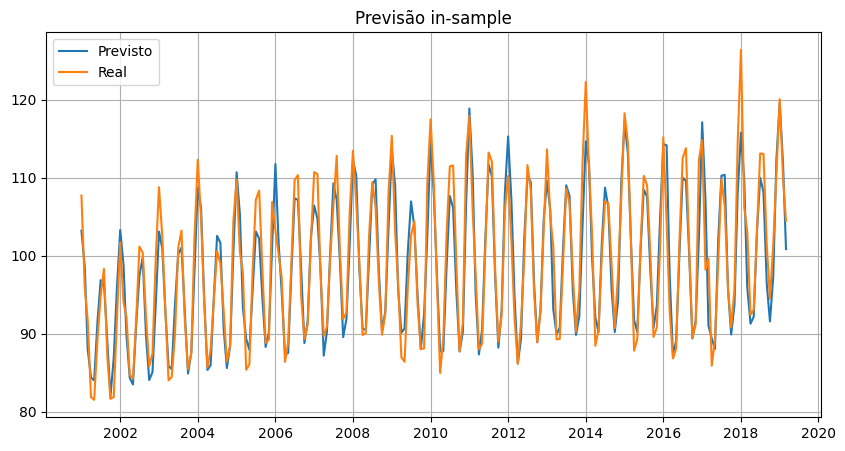


Etapa 3 - Análise de Resíduos In-Sample


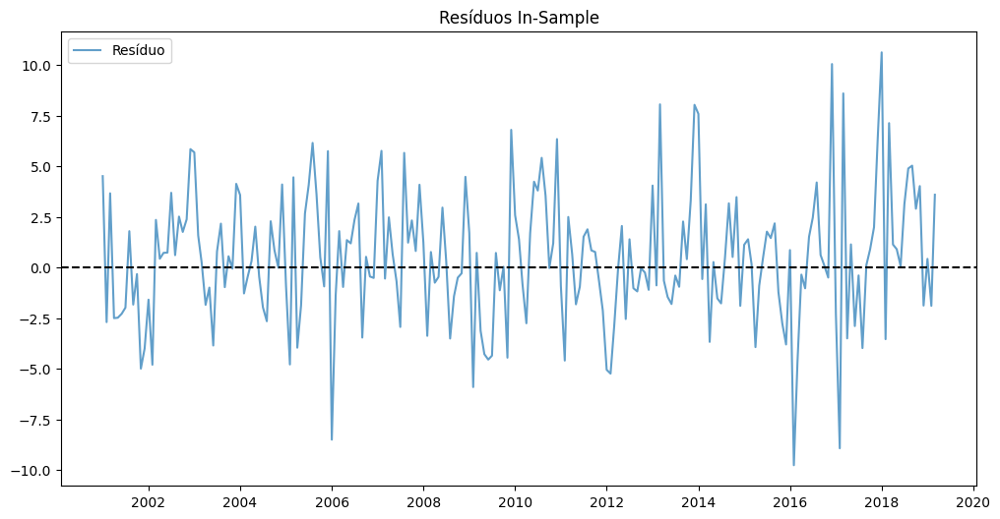

Média: 0.4601, Desvio-padrão: 3.2416

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=14.9913, p-valor=0.1324 → Sem autocorrelação
Lag 20: estatística=33.1479, p-valor=0.0325 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

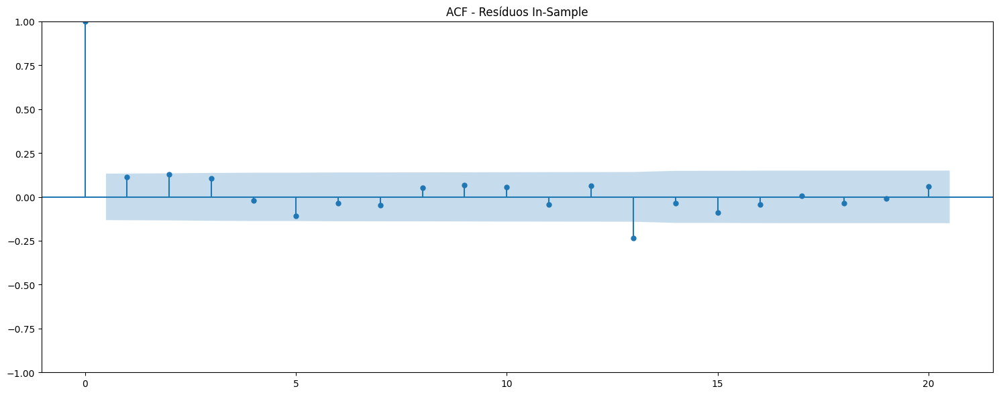


Etapa 4 - Previsões Out-of-Sample


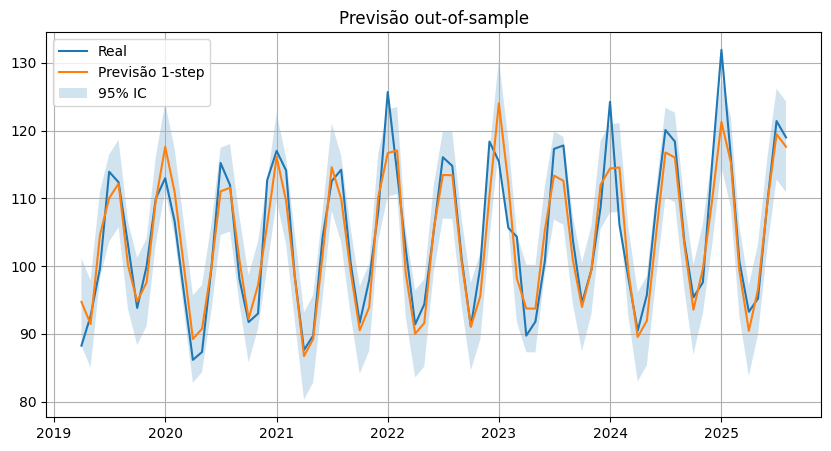


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.0489
MAPE: 0.0285
MSE: 15.4200

Etapa 6 - Análise de Resíduos Out-of-Sample


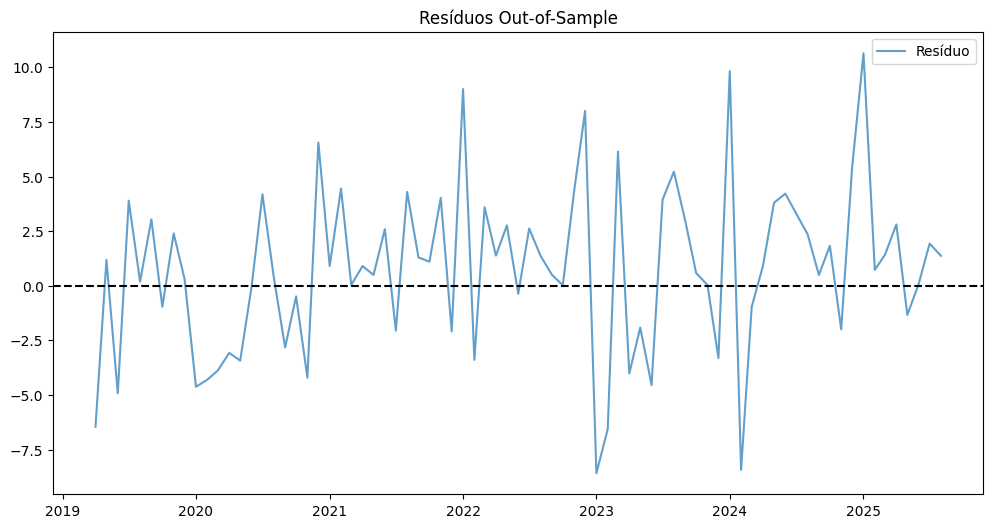

Média: 0.7440, Desvio-padrão: 3.8810

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=4.3483, p-valor=0.9303 → Sem autocorrelação
Lag 20: estatística=9.3483, p-valor=0.9785 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

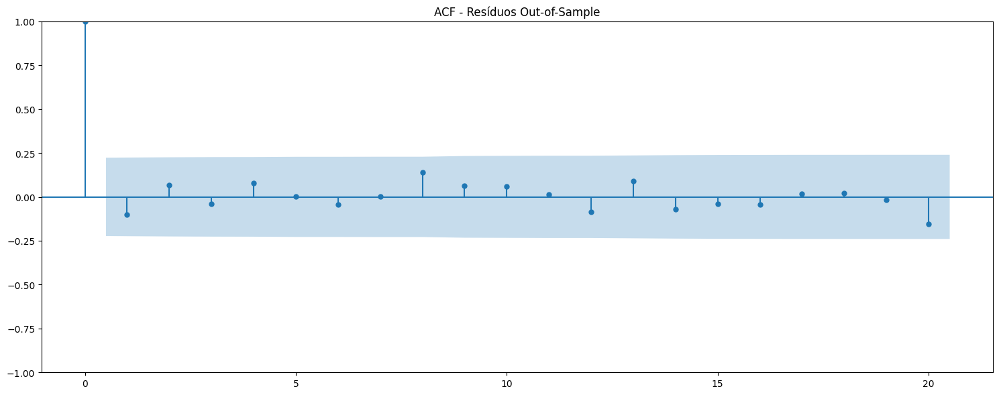


Pipeline finalizado!
Tempo total de execução: 5.57 minutos


In [25]:
resultado_ar_12 = rodar_modelo_arima(y_train, y_test, order=(12,0,0), nome_modelo="AR(12)")

### **5.2.2. Modelo MA**

#### **5.2.2.1. MA(2)**

Rodando MA(2) com order=(0, 0, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


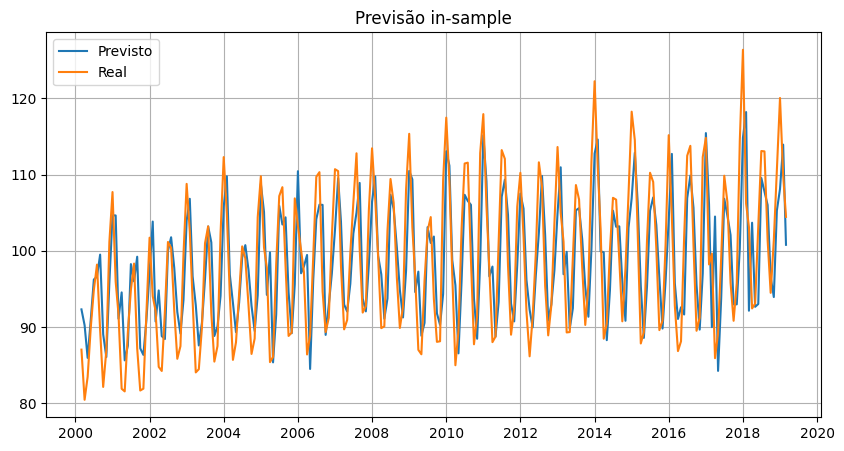


Etapa 3 - Análise de Resíduos In-Sample


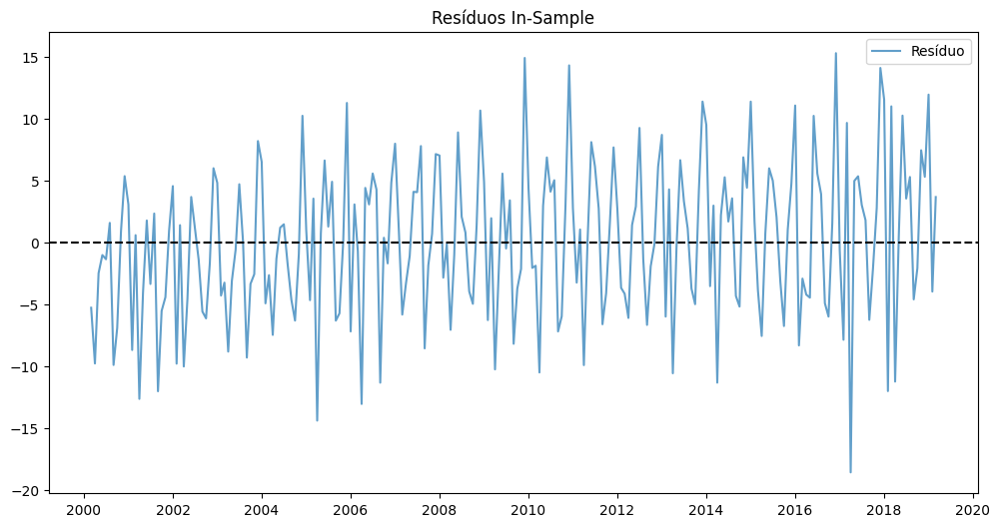

Média: 0.0097, Desvio-padrão: 6.2163

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=216.0608, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=516.0100, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

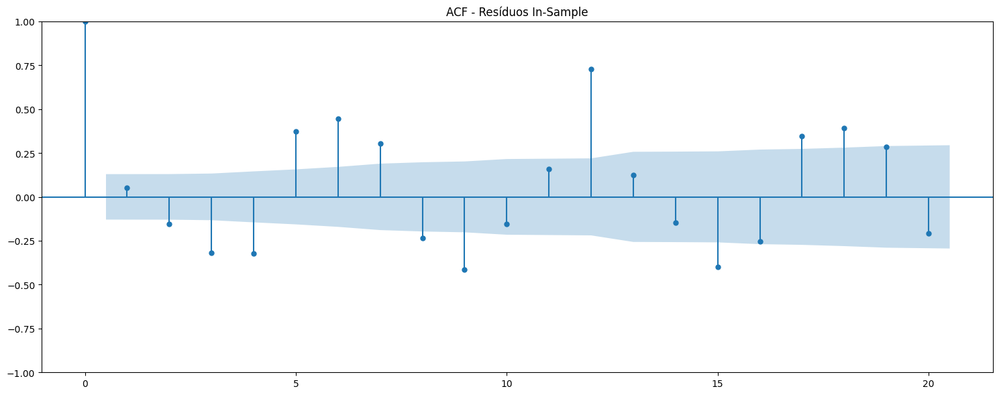


Etapa 4 - Previsões Out-of-Sample


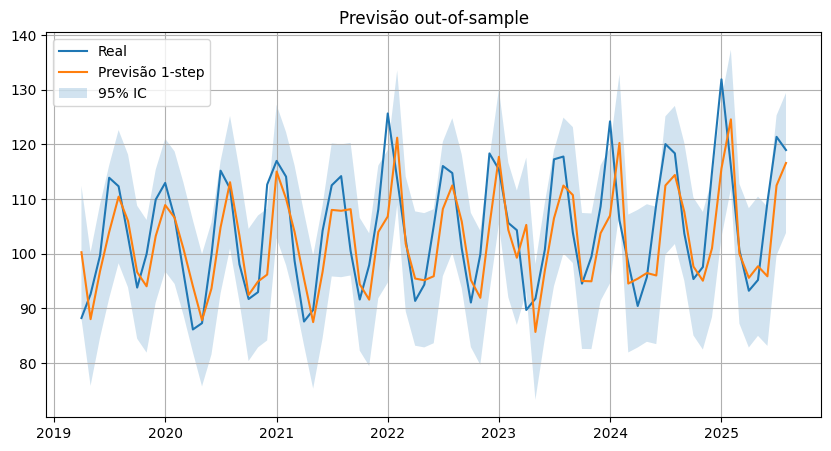


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 5.9887
MAPE: 0.0562
MSE: 56.1290

Etapa 6 - Análise de Resíduos Out-of-Sample


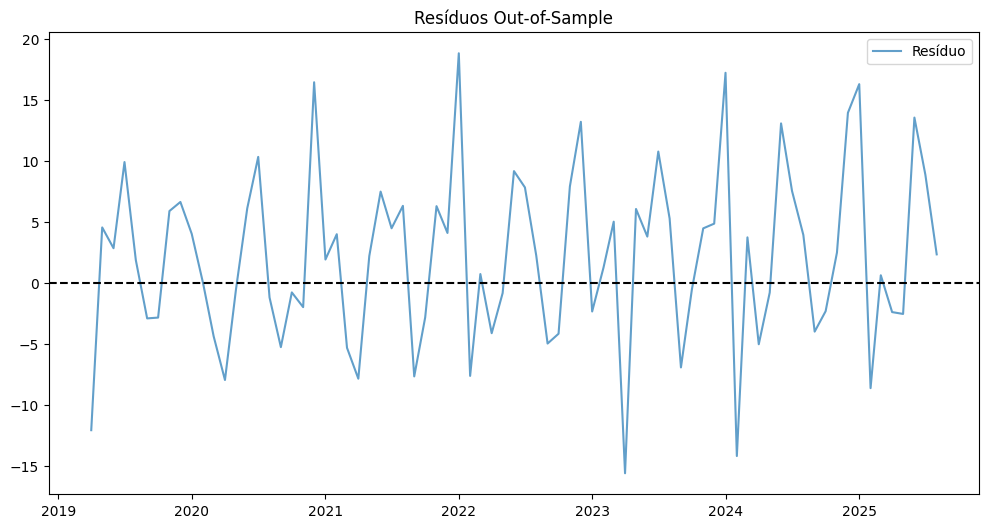

Média: 2.1039, Desvio-padrão: 7.2376

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=85.4674, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=172.7371, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

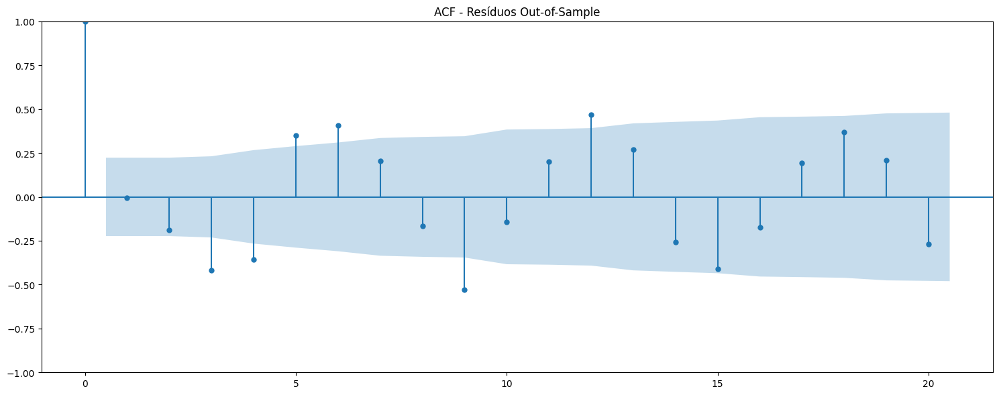


Pipeline finalizado!
Tempo total de execução: 0.26 minutos


In [26]:
resultado_ma_2 = rodar_modelo_arima(y_train, y_test, order=(0,0,2), nome_modelo="MA(2)")

#### **5.2.2.2. MA(6)**

Rodando MA(6) com order=(0, 0, 6) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


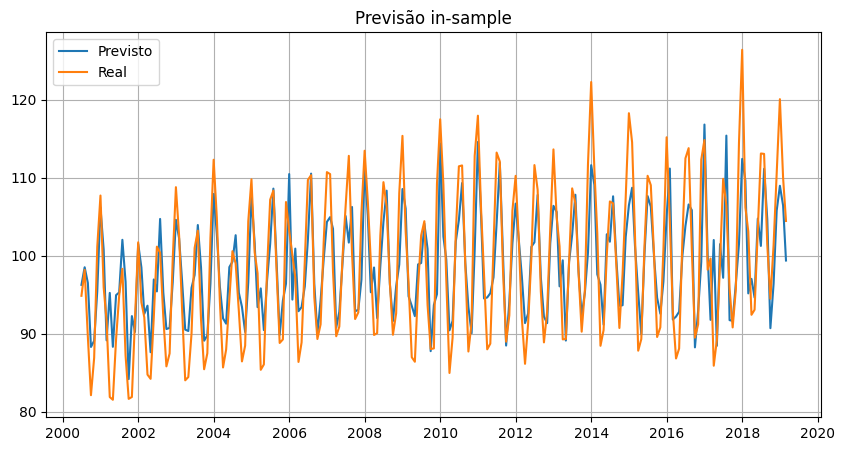


Etapa 3 - Análise de Resíduos In-Sample


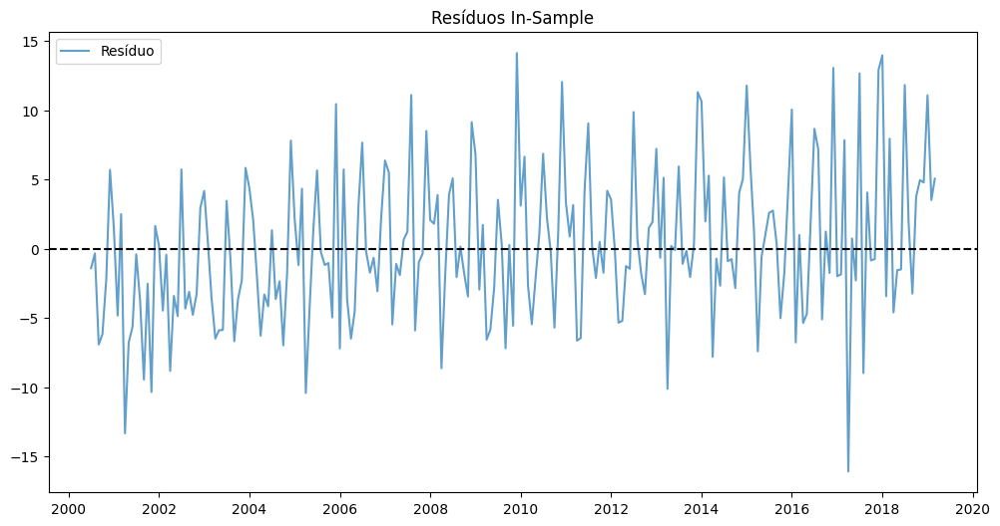

Média: 0.1694, Desvio-padrão: 5.4239

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=87.2903, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=245.2289, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

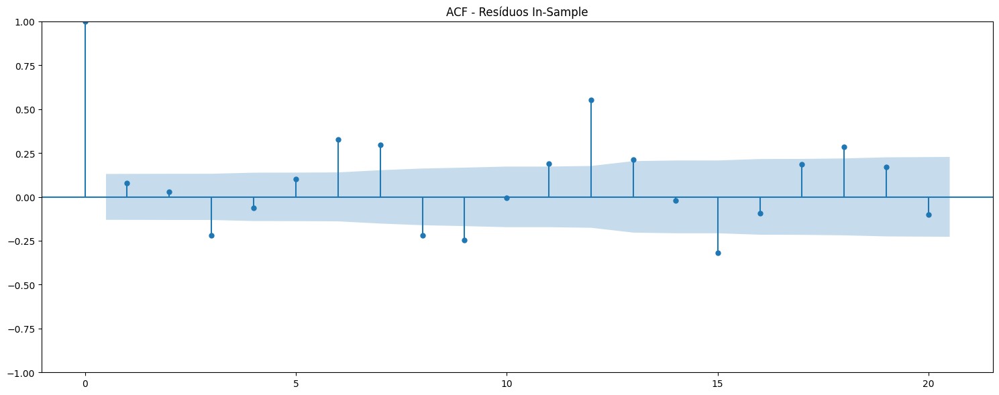


Etapa 4 - Previsões Out-of-Sample


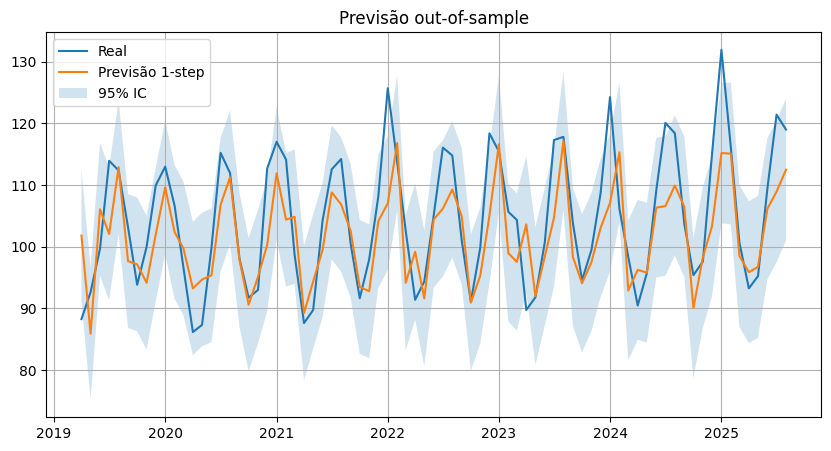


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 5.6883
MAPE: 0.0532
MSE: 51.9413

Etapa 6 - Análise de Resíduos Out-of-Sample


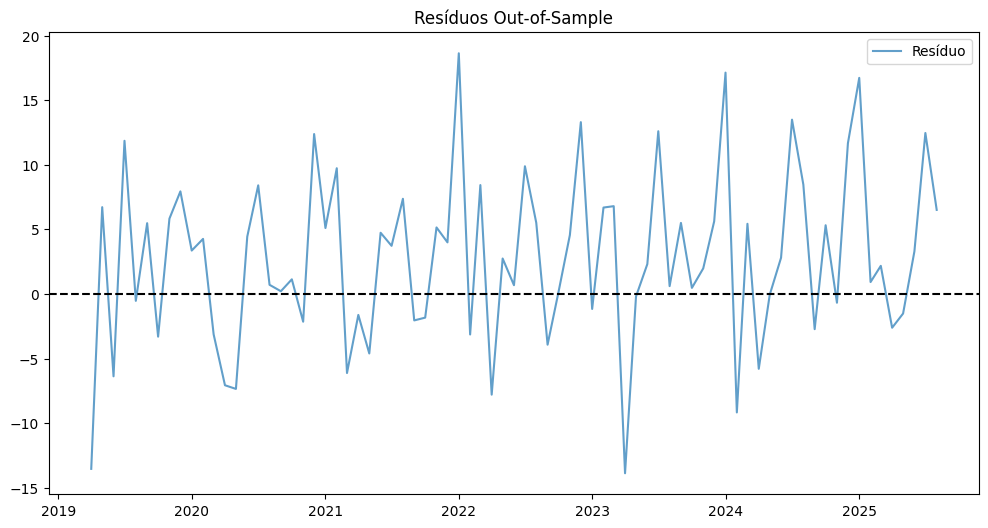

Média: 2.7700, Desvio-padrão: 6.6971

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=40.4426, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=84.7363, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

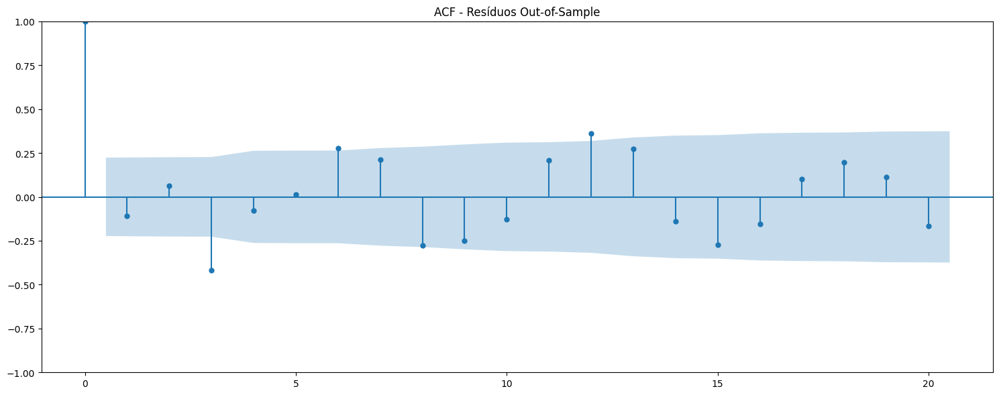


Pipeline finalizado!
Tempo total de execução: 0.41 minutos


In [27]:
resultado_ma_6 = rodar_modelo_arima(y_train, y_test, order=(0,0,6), nome_modelo="MA(6)")

#### **5.2.2.3. MA(12)**

Rodando MA(12) com order=(0, 0, 12) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


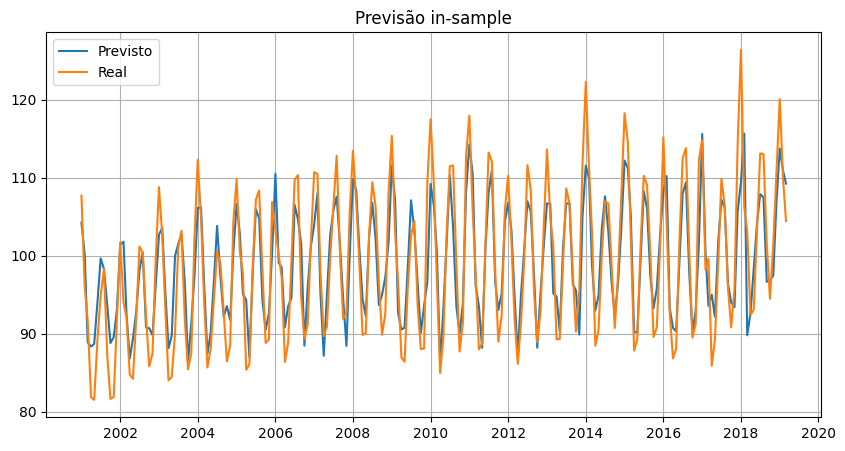


Etapa 3 - Análise de Resíduos In-Sample


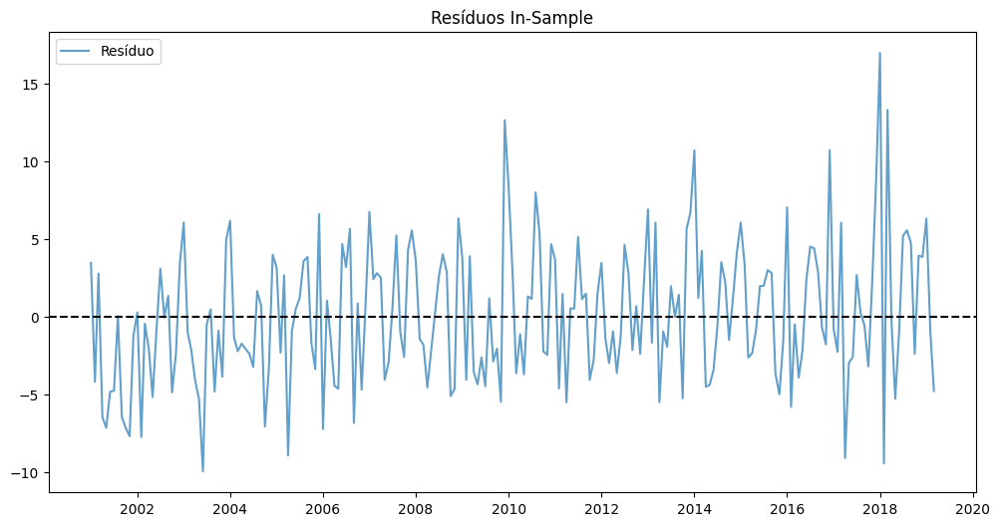

Média: 0.0351, Desvio-padrão: 4.4134

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=13.2356, p-valor=0.2108 → Sem autocorrelação
Lag 20: estatística=88.9895, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

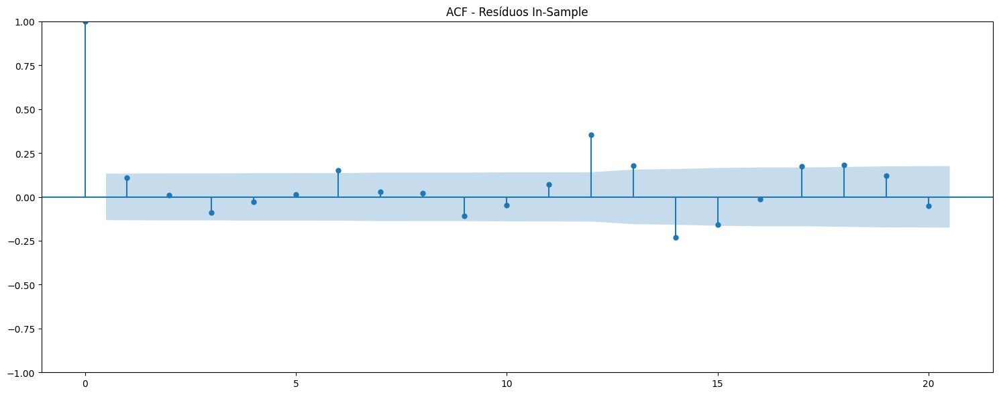


Etapa 4 - Previsões Out-of-Sample


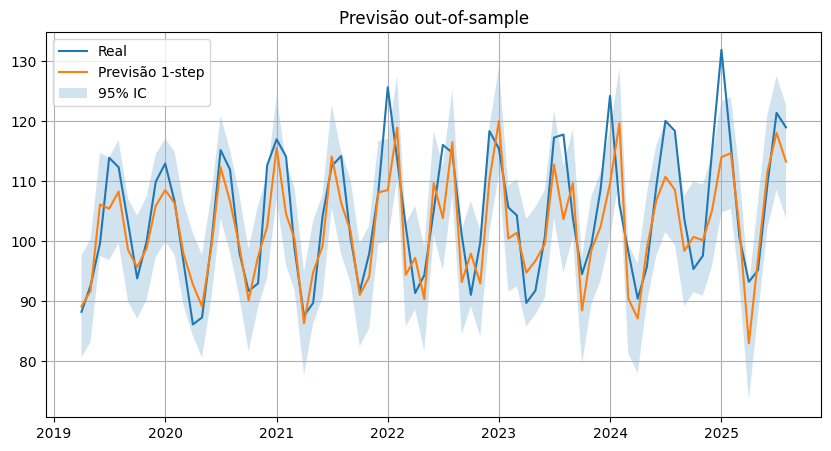


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 5.1035
MAPE: 0.0476
MSE: 41.7171

Etapa 6 - Análise de Resíduos Out-of-Sample


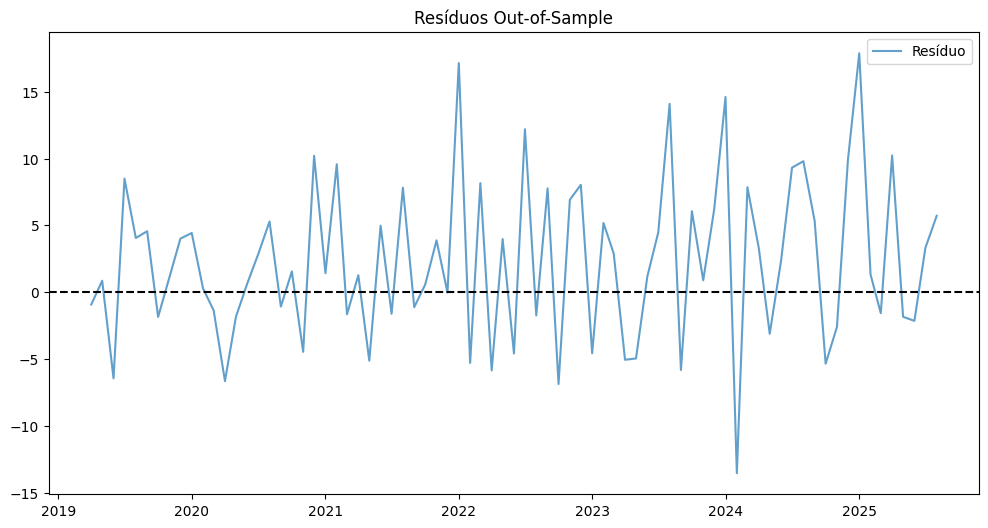

Média: 2.2666, Desvio-padrão: 6.0878

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=15.8648, p-valor=0.1036 → Sem autocorrelação
Lag 20: estatística=59.6344, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

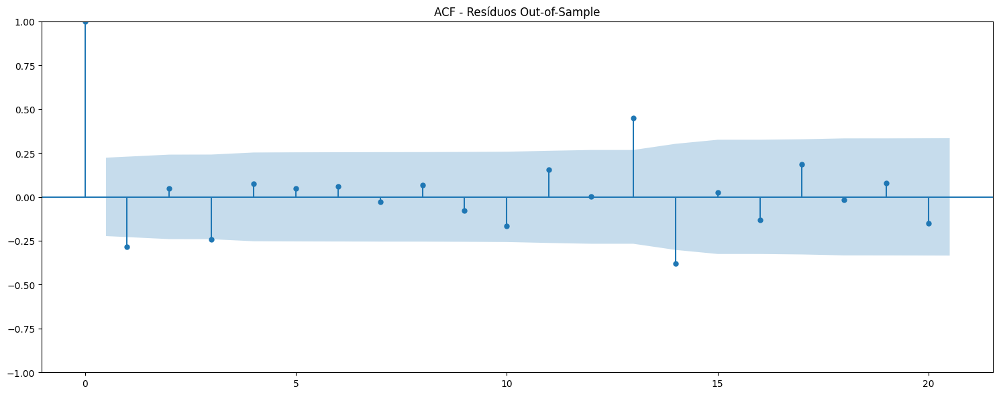


Pipeline finalizado!
Tempo total de execução: 4.45 minutos


In [28]:
resultado_ma_12 = rodar_modelo_arima(y_train, y_test, order=(0,0,12), nome_modelo="MA(12)")

### **5.2.3. Modelo ARMA**

#### **5.2.3.1. ARMA(2,2)**

Rodando ARMA(2,2) com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


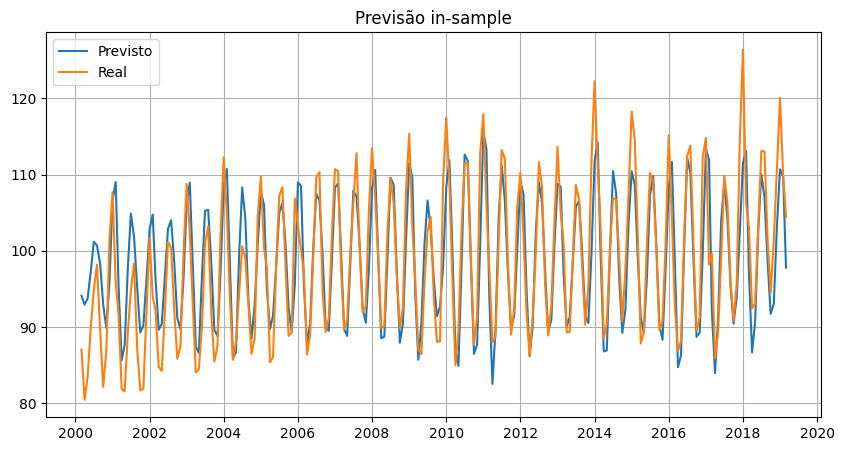


Etapa 3 - Análise de Resíduos In-Sample


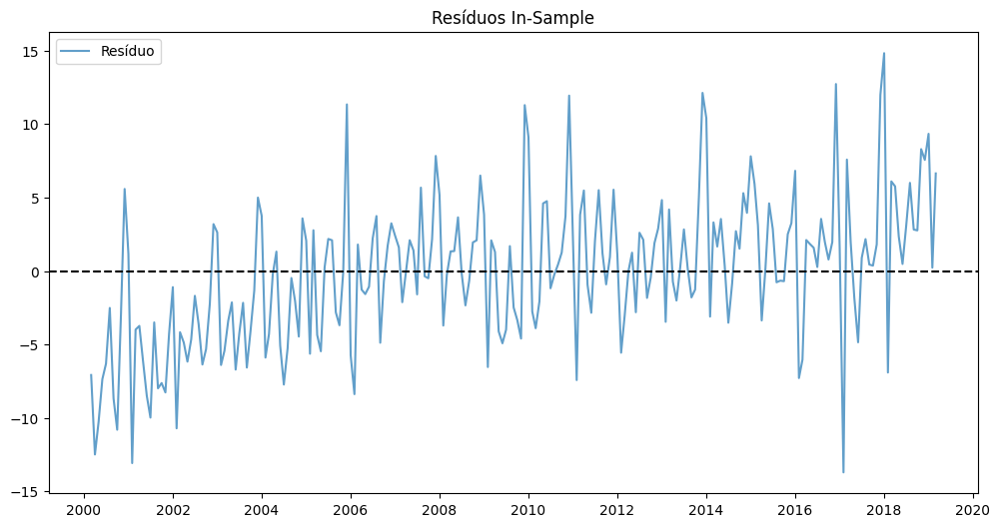

Média: -0.1309, Desvio-padrão: 4.9656

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=148.8453, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=297.1209, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

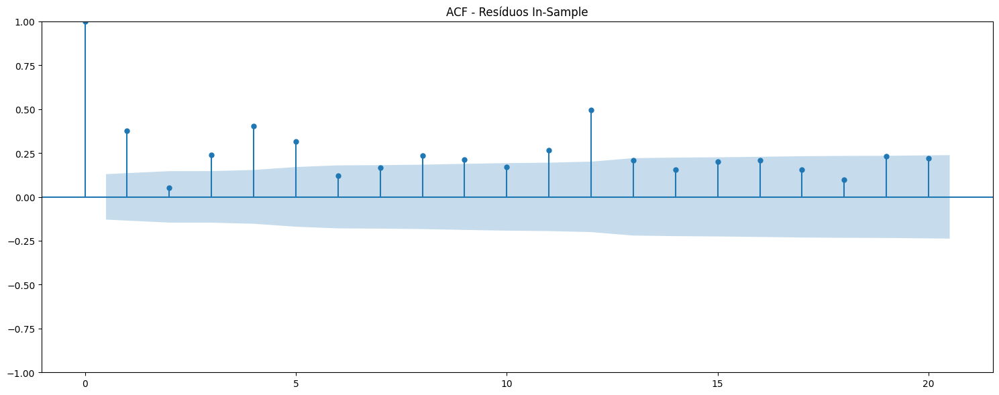


Etapa 4 - Previsões Out-of-Sample


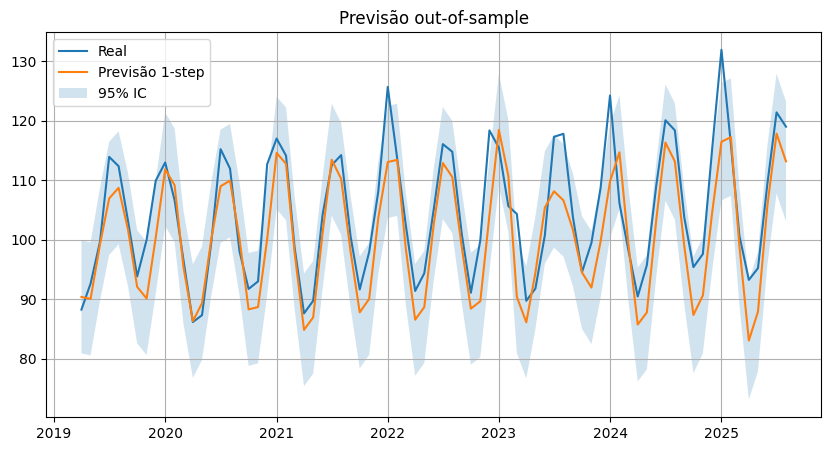


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 4.9742
MAPE: 0.0467
MSE: 39.3288

Etapa 6 - Análise de Resíduos Out-of-Sample


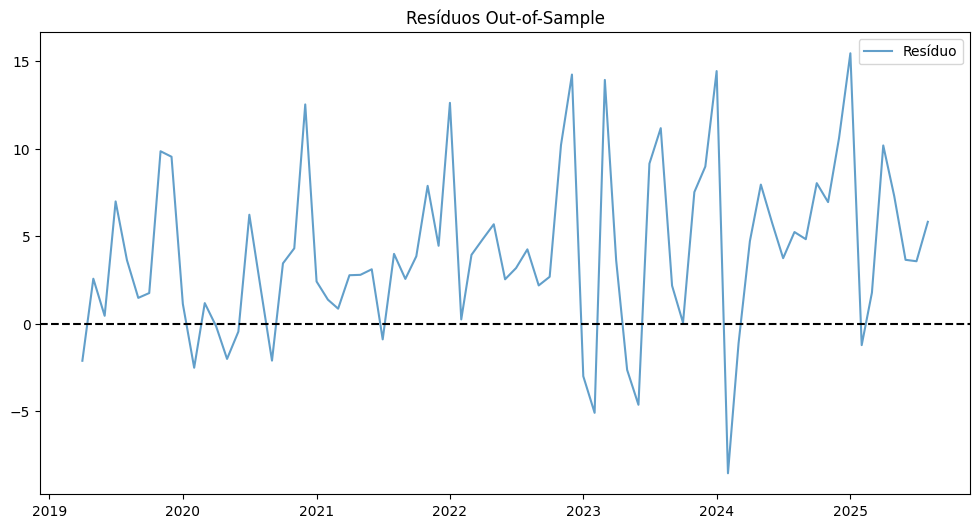

Média: 4.0233, Desvio-padrão: 4.8421

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=29.6548, p-valor=0.0010 → Autocorrelação detectada
Lag 20: estatística=44.8629, p-valor=0.0012 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

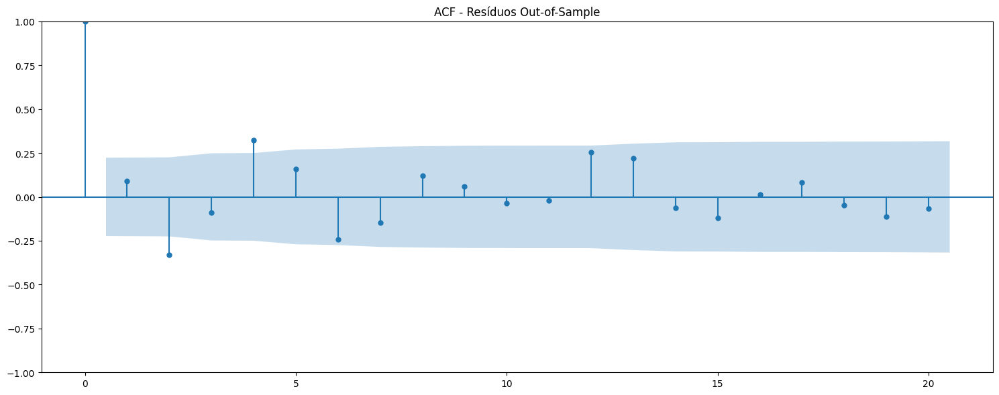


Pipeline finalizado!
Tempo total de execução: 0.38 minutos


In [29]:
resultado_arma_2_2 = rodar_modelo_arima(y_train, y_test, order=(2,0,2), nome_modelo="ARMA(2,2)")

#### **5.2.3.2. ARMA(6,3)**

Rodando ARMA(6,3) com order=(6, 0, 3) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


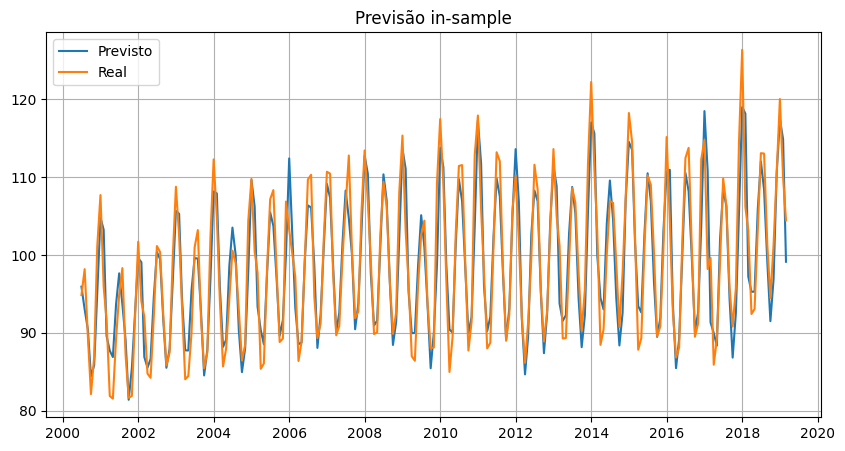


Etapa 3 - Análise de Resíduos In-Sample


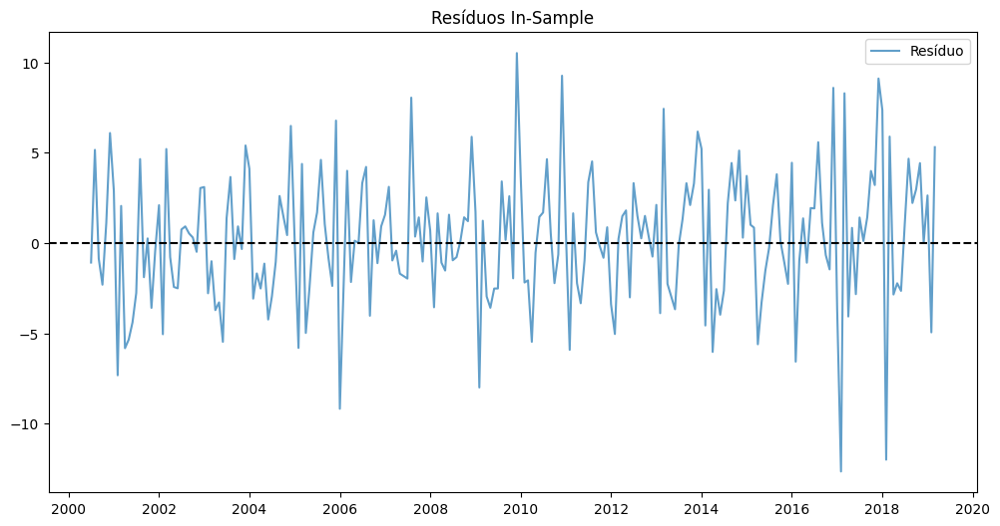

Média: 0.1905, Desvio-padrão: 3.6471

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=25.9587, p-valor=0.0038 → Autocorrelação detectada
Lag 20: estatística=93.4622, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

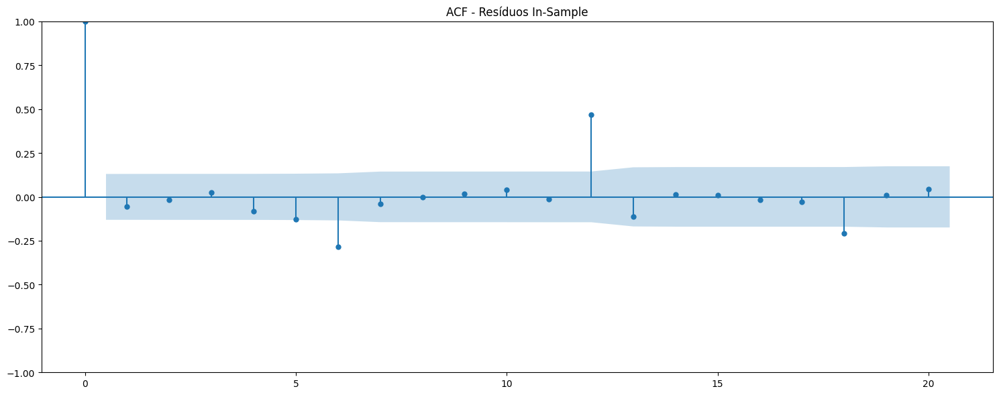


Etapa 4 - Previsões Out-of-Sample


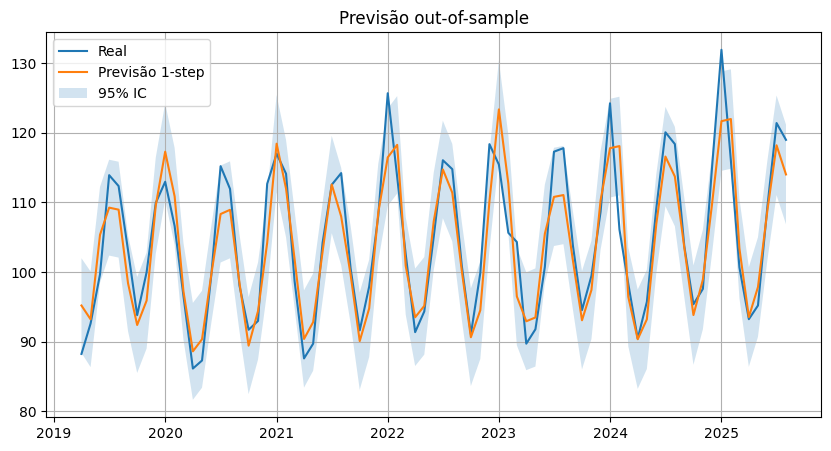


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.3835
MAPE: 0.0315
MSE: 18.5113

Etapa 6 - Análise de Resíduos Out-of-Sample


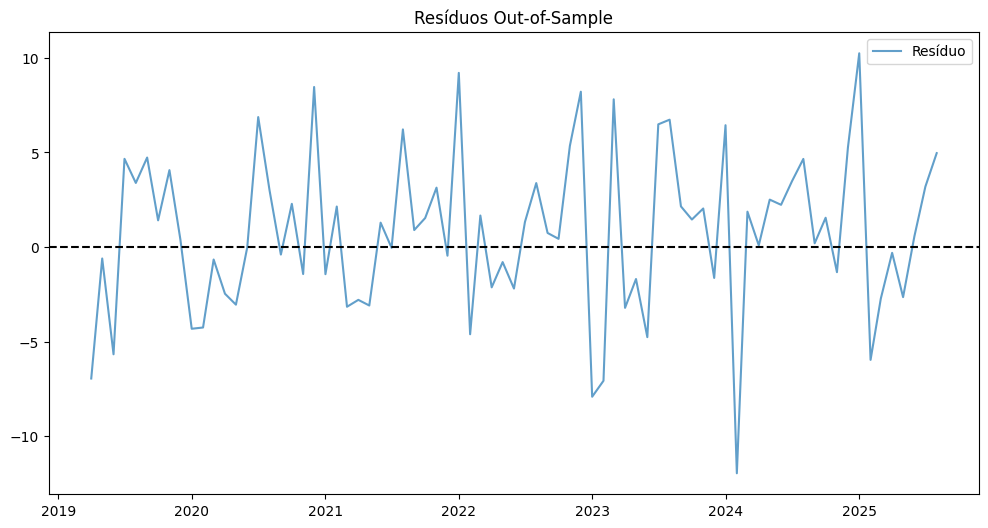

Média: 0.7389, Desvio-padrão: 4.2663

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=12.1518, p-valor=0.2750 → Sem autocorrelação
Lag 20: estatística=27.2777, p-valor=0.1276 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

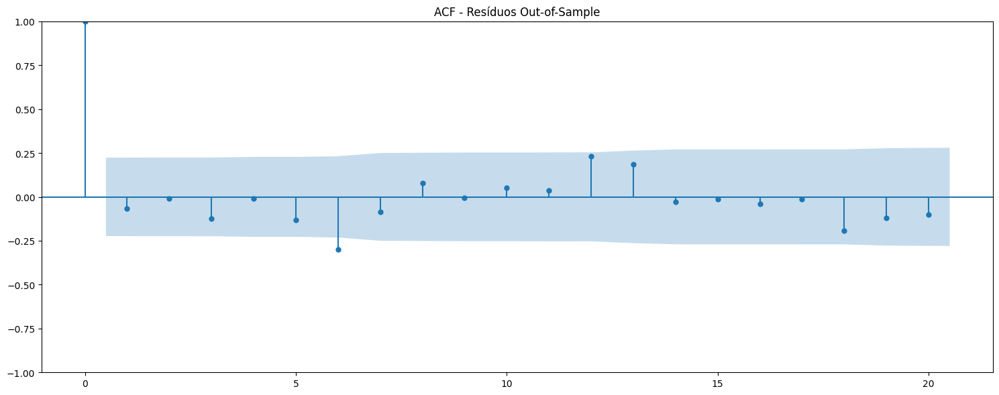


Pipeline finalizado!
Tempo total de execução: 0.64 minutos


In [30]:
resultado_arma_6_3 = rodar_modelo_arima(y_train, y_test, order=(6,0,3), nome_modelo="ARMA(6,3)")

### **5.2.4. Modelo ARIMA**

<span style="color:red;">**TODO**</span>: checar se uma diferenciação é suficiente!


#### **5.2.4.1. ARIMA(2,1,2)**

Rodando ARIMA(2,1,2) com order=(2, 1, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo



Etapa 2 - Previsões In-Sample


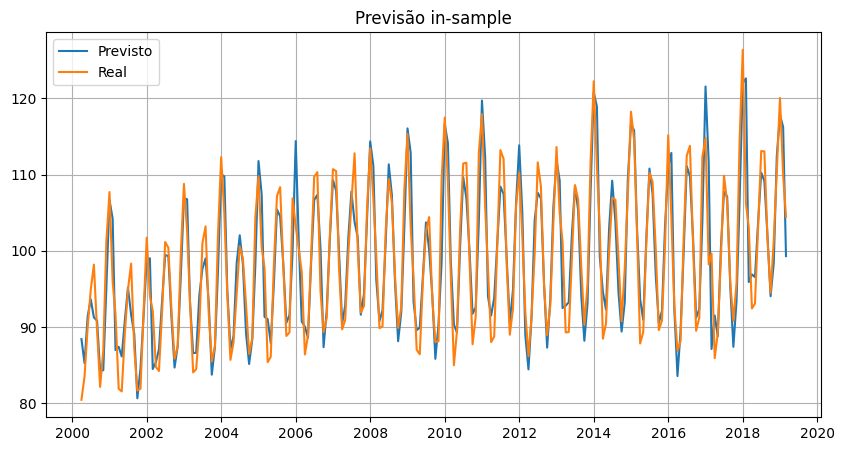


Etapa 3 - Análise de Resíduos In-Sample


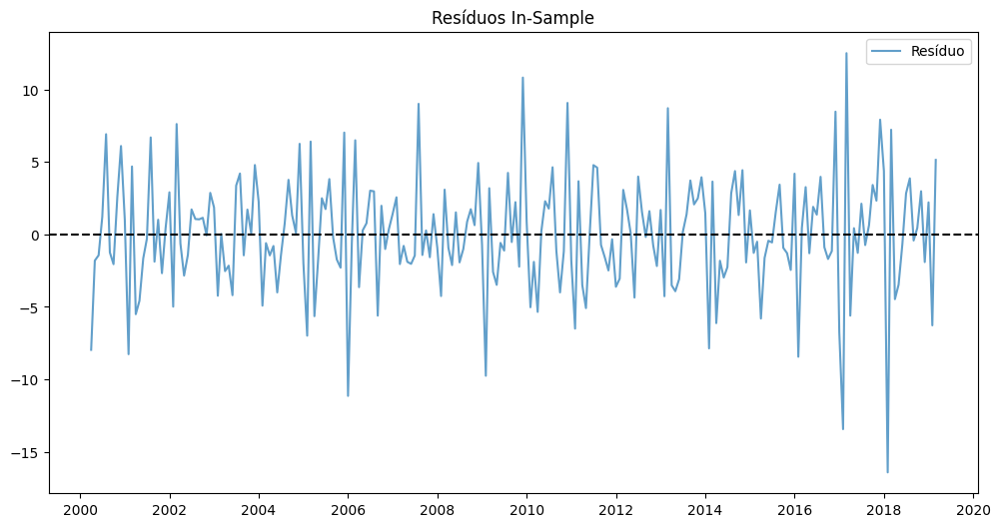

Média: -0.0187, Desvio-padrão: 3.9978

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=28.7983, p-valor=0.0013 → Autocorrelação detectada
Lag 20: estatística=105.8027, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

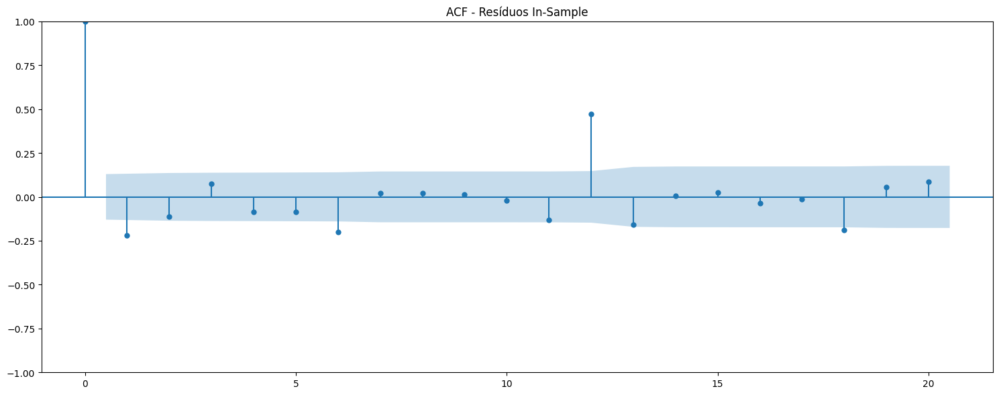


Etapa 4 - Previsões Out-of-Sample


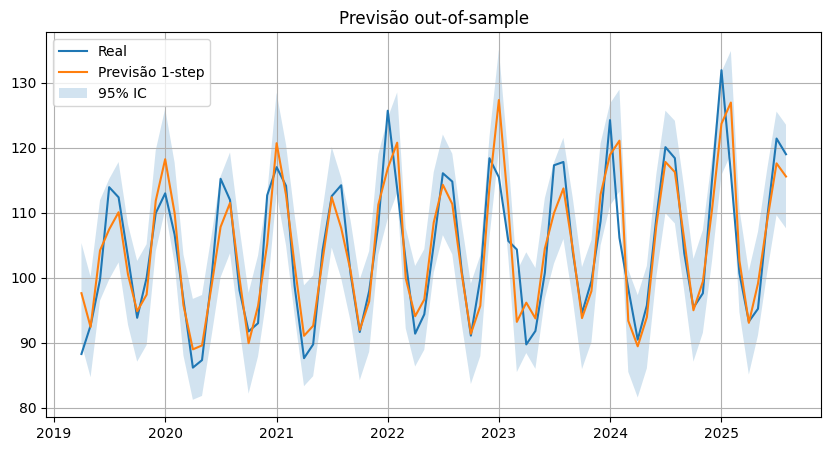


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.5377
MAPE: 0.0331
MSE: 21.6227

Etapa 6 - Análise de Resíduos Out-of-Sample


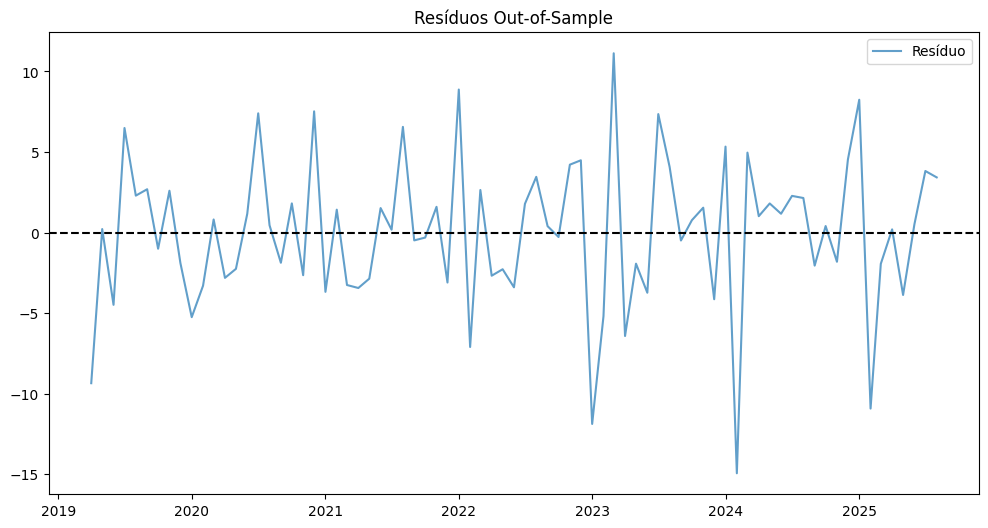

Média: -0.0250, Desvio-padrão: 4.6804

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=12.1861, p-valor=0.2728 → Sem autocorrelação
Lag 20: estatística=19.8277, p-valor=0.4688 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

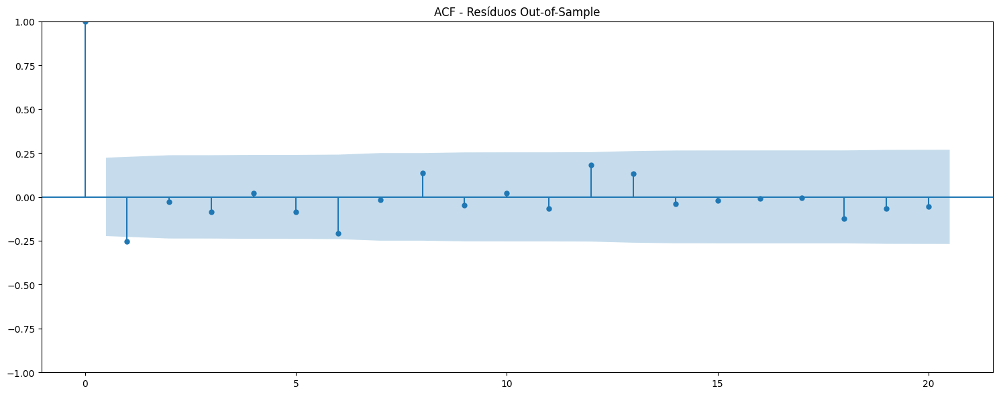


Pipeline finalizado!
Tempo total de execução: 0.46 minutos


In [31]:
resultado_arima_2_1_2 = rodar_modelo_arima(y_train, y_test, order=(2,1,2), nome_modelo="ARIMA(2,1,2)")

#### **5.2.4.2. ARIMA(6,1,3)**

Rodando ARIMA(6,1,3) com order=(6, 1, 3) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


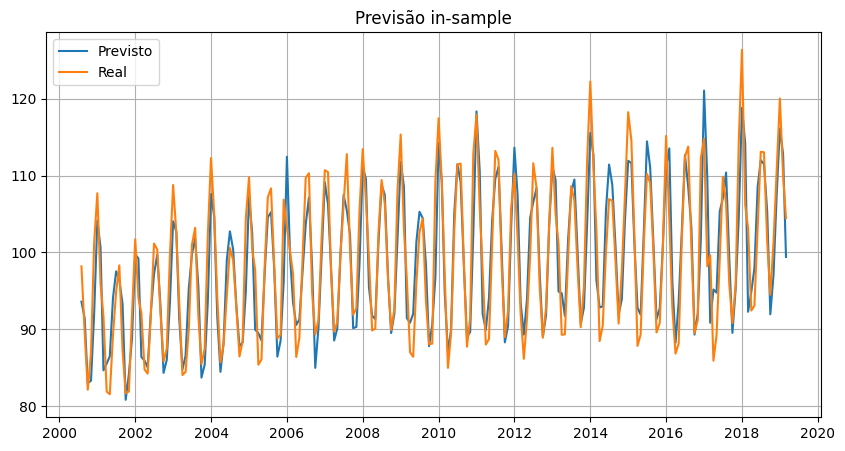


Etapa 3 - Análise de Resíduos In-Sample


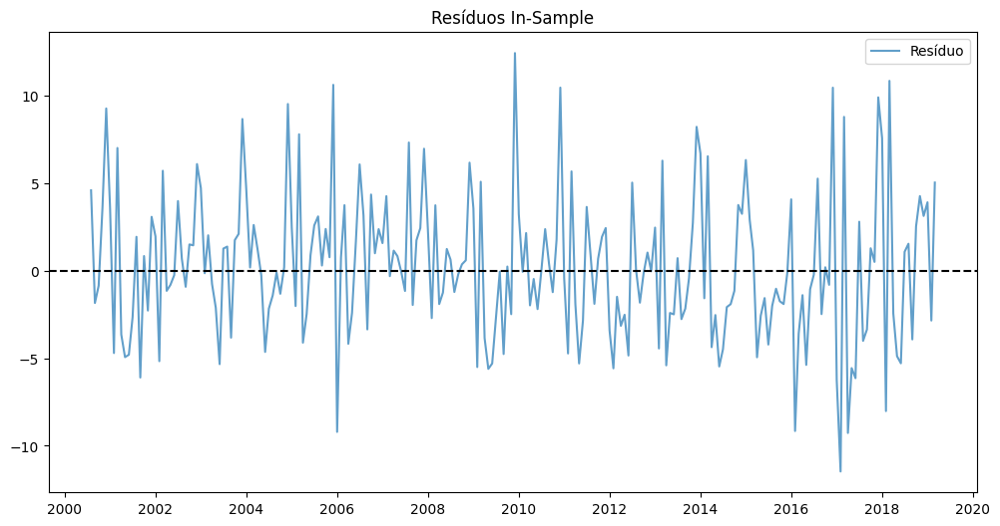

Média: 0.2237, Desvio-padrão: 4.1581

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=37.8390, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=109.3315, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

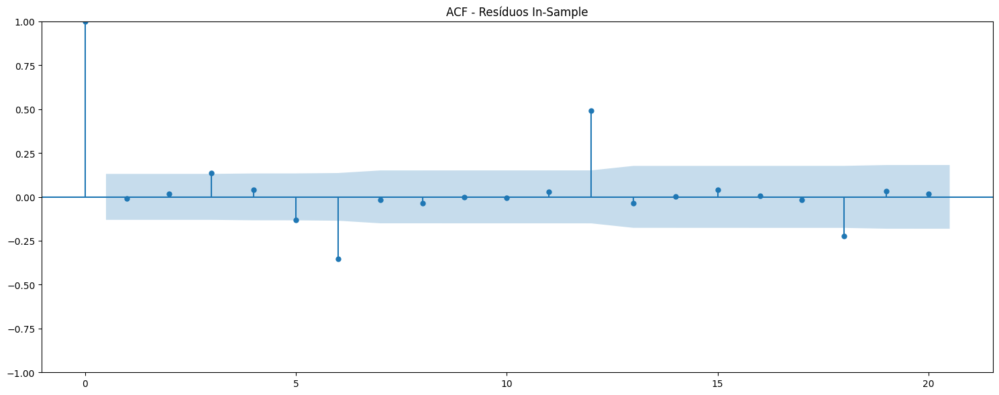


Etapa 4 - Previsões Out-of-Sample


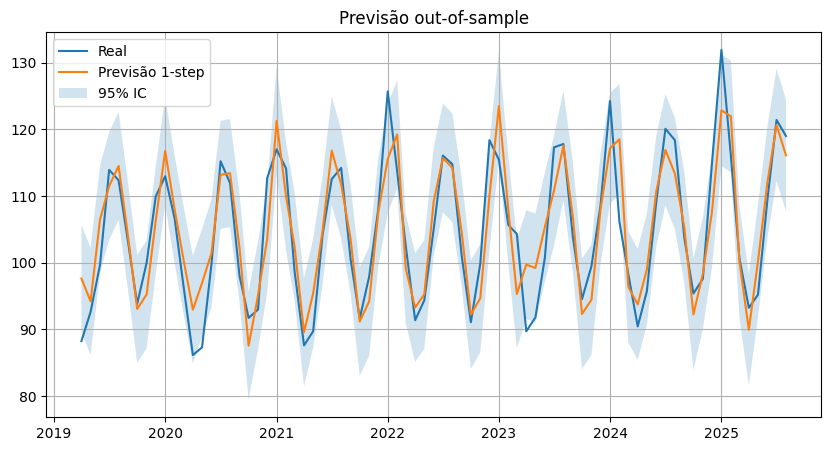


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.9237
MAPE: 0.0378
MSE: 23.4938

Etapa 6 - Análise de Resíduos Out-of-Sample


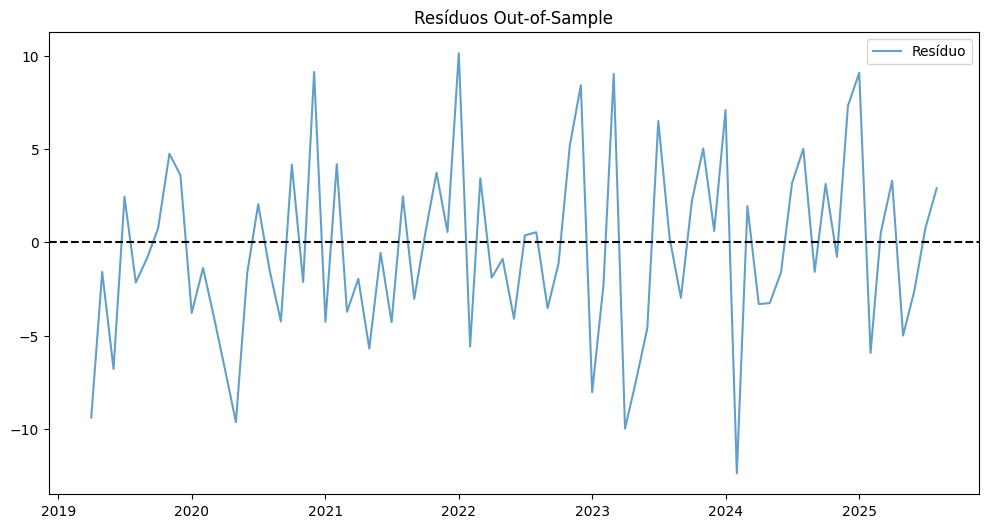

Média: -0.4458, Desvio-padrão: 4.8582

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=13.0111, p-valor=0.2231 → Sem autocorrelação
Lag 20: estatística=33.3869, p-valor=0.0306 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

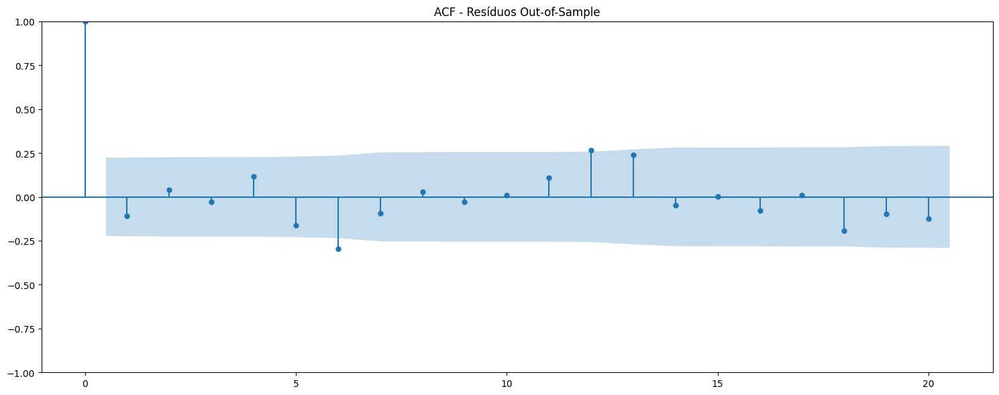


Pipeline finalizado!
Tempo total de execução: 0.60 minutos


In [32]:
resultado_arima_6_1_3 = rodar_modelo_arima(y_train, y_test, order=(6,1,3), nome_modelo="ARIMA(6,1,3)")

### **5.2.5. AUTO ARIMA**

#### **5.2.5.1. AUTO ARIMA SEM SAZONALIDADE**

In [33]:
model_AutoARIMA = Pipeline(
    [
        ##('boxcox', BoxCoxEndogTransformer()),
        (
            "auto - arima",
            pm.AutoARIMA(
                trace=True,
                suppress_warnings=True,
                max_p=10,
                stepwise=True,
                seasonal=False,
                m=6,
            ),
        )
    ]
)

model_AutoARIMA.fit(y_train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1302.453, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1665.006, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1636.976, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1602.576, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1663.006, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1370.985, Time=0.64 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1282.357, Time=2.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=1305.232, Time=3.36 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=1266.444, Time=1.97 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(3,1,4)(0,0,0)[0] intercept   : AIC=1271.360, Time=3.40 sec
 ARIMA(2,1,5)(0,0,0)[0] intercept   : AIC=1275.037, T

,steps,"[('auto - arima', ...)]"


Rodando ARIMA(2,1,5) com order=(2, 1, 5) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


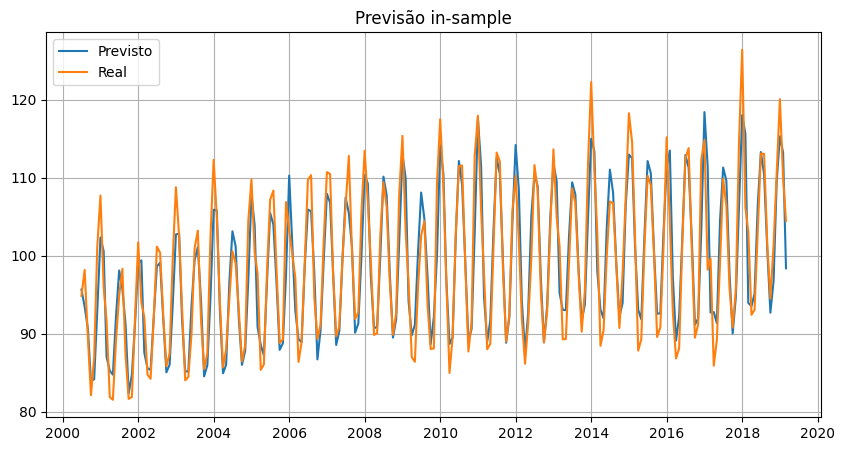


Etapa 3 - Análise de Resíduos In-Sample


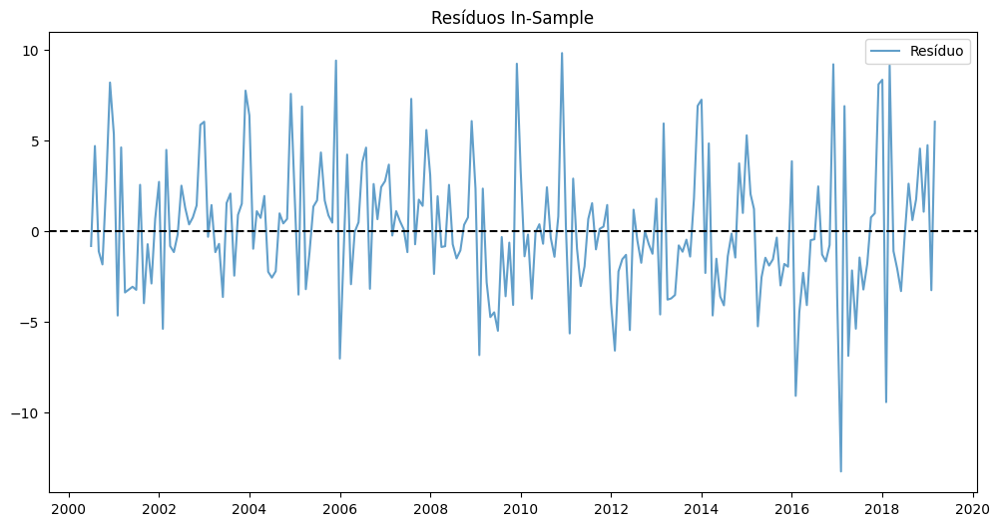

Média: 0.1238, Desvio-padrão: 3.6961

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=14.2129, p-valor=0.1635 → Sem autocorrelação
Lag 20: estatística=77.3250, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

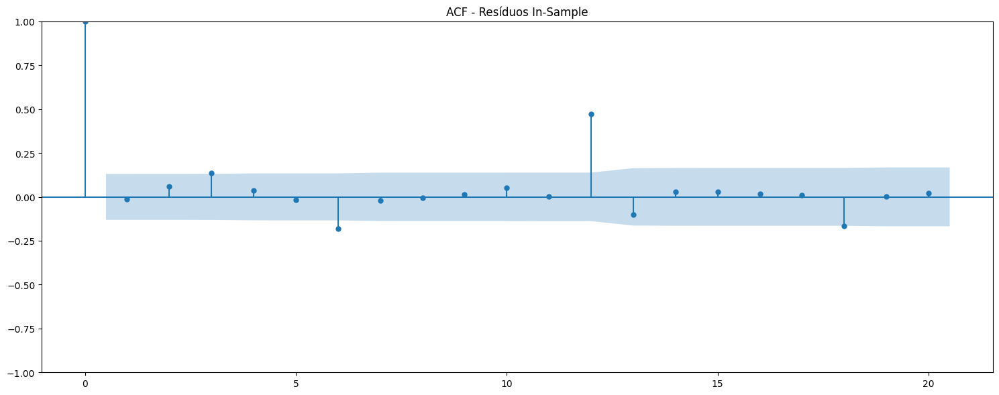


Etapa 4 - Previsões Out-of-Sample


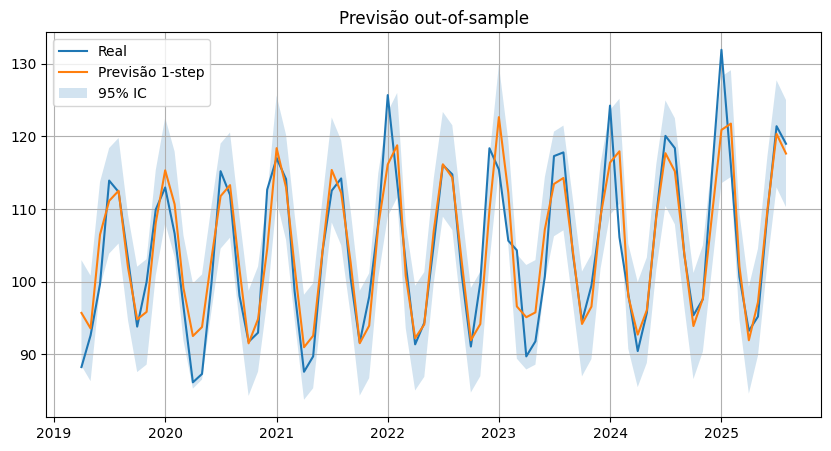


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.1109
MAPE: 0.0295
MSE: 17.5986

Etapa 6 - Análise de Resíduos Out-of-Sample


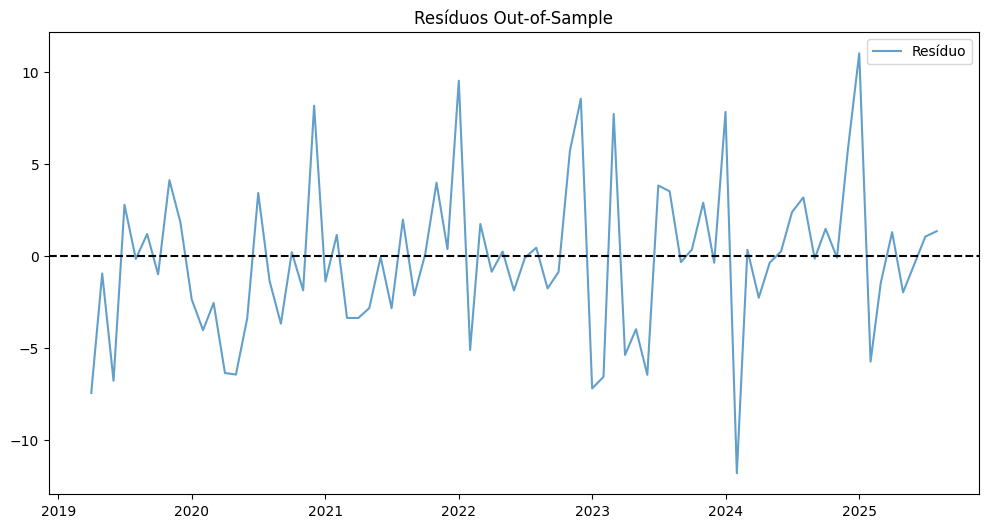

Média: -0.2570, Desvio-padrão: 4.2146

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=6.8544, p-valor=0.7391 → Sem autocorrelação
Lag 20: estatística=21.0899, p-valor=0.3919 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

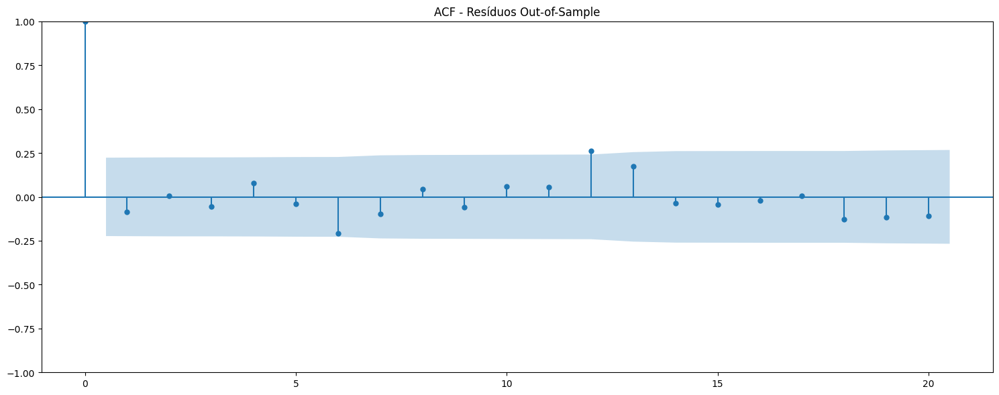


Pipeline finalizado!
Tempo total de execução: 0.69 minutos


In [35]:
resultado_arima_2_1_5 = rodar_modelo_arima(y_train, y_test, order=(2,1,5), nome_modelo="ARIMA(2,1,5)")

#### **5.2.5.1. AUTO ARIMA COM SAZONALIDADE**

In [34]:
model_AutoARIMA = Pipeline(
    [
        ##('boxcox', BoxCoxEndogTransformer()),
        (
            "auto - arima",
            pm.AutoARIMA(
                trace=True,
                suppress_warnings=True,
                max_p=10,
                stepwise=True,
                seasonal=True,
                m=6,
            ),
        )
    ]
)

model_AutoARIMA.fit(y_train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[6] intercept   : AIC=inf, Time=4.75 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=1665.006, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=1464.371, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[6] intercept   : AIC=1572.822, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[6]             : AIC=1663.006, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[6] intercept   : AIC=1636.976, Time=0.08 sec
 ARIMA(1,1,0)(2,0,0)[6] intercept   : AIC=inf, Time=3.00 sec
 ARIMA(1,1,0)(1,0,1)[6] intercept   : AIC=1296.037, Time=2.51 sec
 ARIMA(1,1,0)(0,0,1)[6] intercept   : AIC=1585.927, Time=1.52 sec
 ARIMA(1,1,0)(2,0,1)[6] intercept   : AIC=1256.818, Time=9.56 sec
 ARIMA(1,1,0)(2,0,2)[6] intercept   : AIC=1214.278, Time=13.02 sec
 ARIMA(1,1,0)(1,0,2)[6] intercept   : AIC=1275.140, Time=7.30 sec
 ARIMA(0,1,0)(2,0,2)[6] intercept   : AIC=1220.581, Time=14.37 sec
 ARIMA(2,1,0)(2,0,2)[6] intercept   : AIC=inf, Time=24.00 sec
 ARIMA(1,1,1)(2,0,2)[6] intercept   : AIC=117

,steps,"[('auto - arima', ...)]"


Rodando SARIMA(1,1,1)(2,0,2)[6] com order=(1, 1, 1) seasonal_order=(2, 0, 2, 6)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


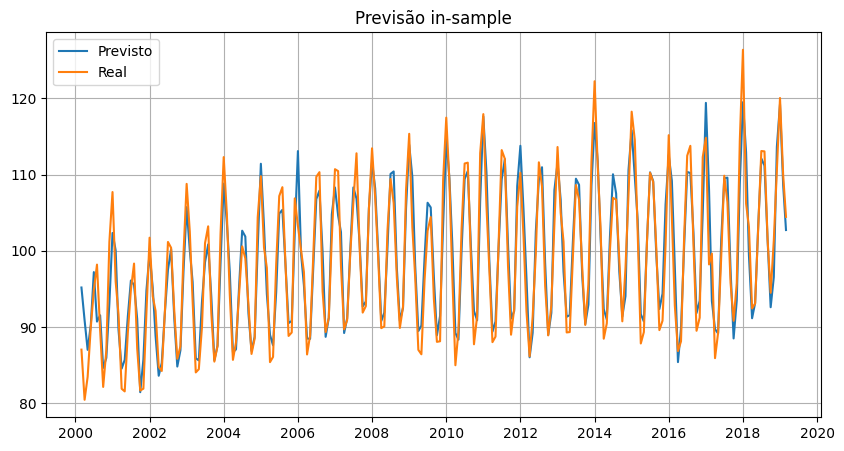


Etapa 3 - Análise de Resíduos In-Sample


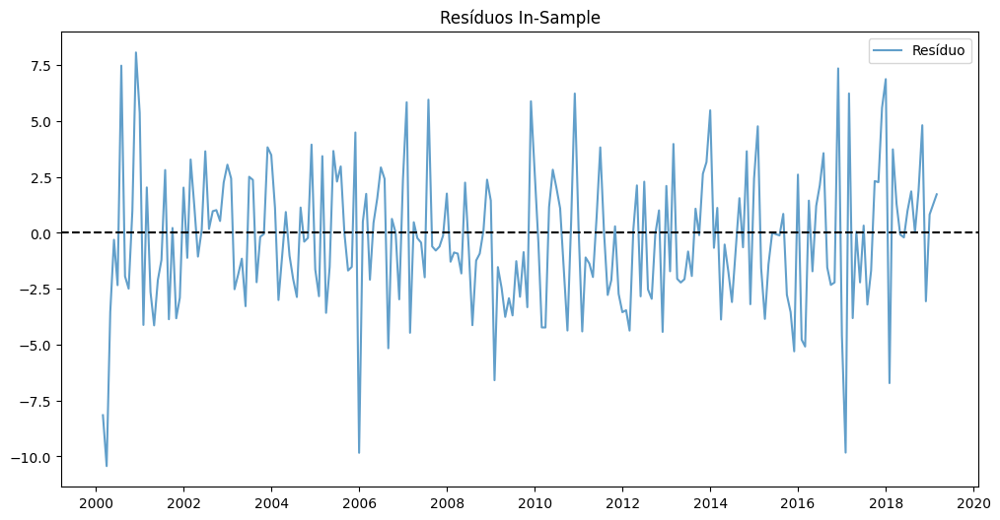

Média: -0.3085, Desvio-padrão: 3.0915

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=10.7959, p-valor=0.3736 → Sem autocorrelação
Lag 20: estatística=23.0464, p-valor=0.2865 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

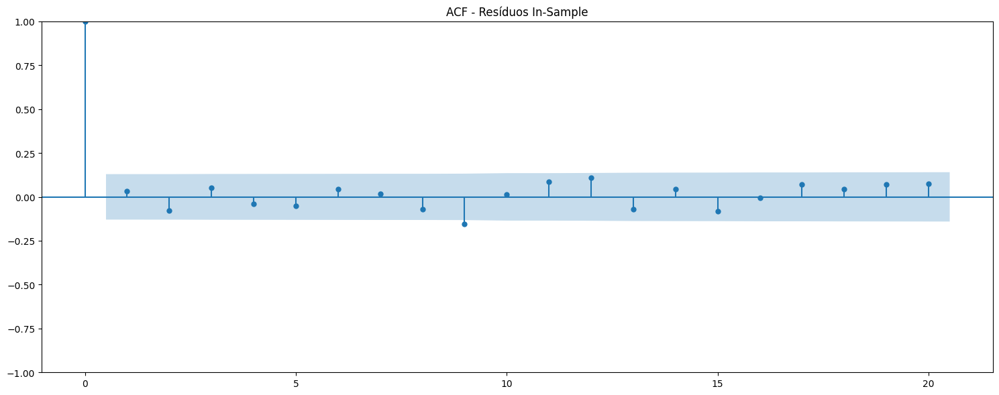


Etapa 4 - Previsões Out-of-Sample


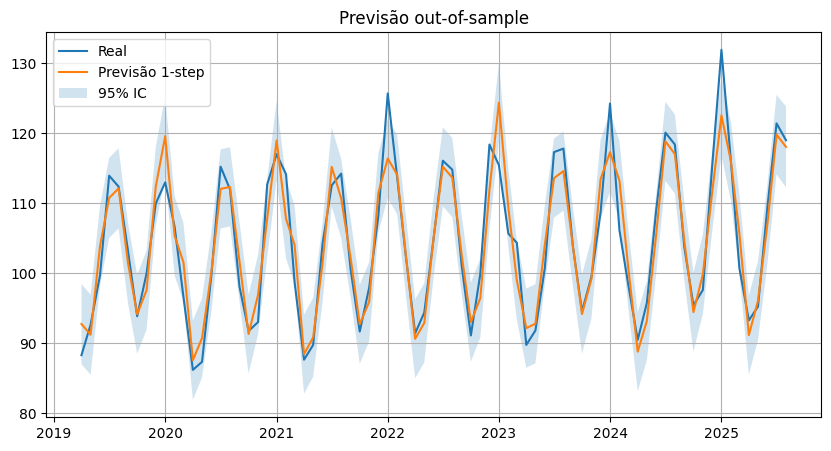


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 2.7129
MAPE: 0.0254
MSE: 12.2890

Etapa 6 - Análise de Resíduos Out-of-Sample


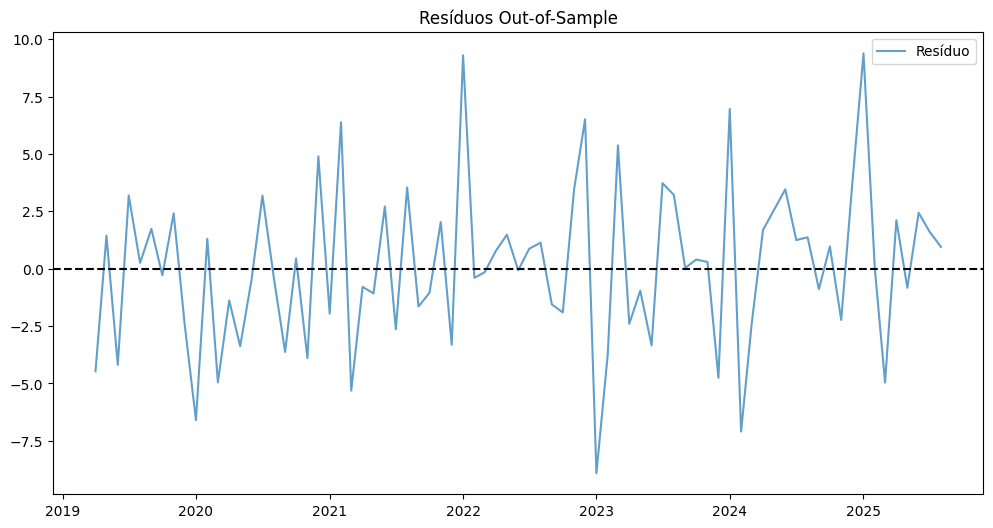

Média: 0.1039, Desvio-padrão: 3.5270

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=6.2550, p-valor=0.7934 → Sem autocorrelação
Lag 20: estatística=16.8147, p-valor=0.6650 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

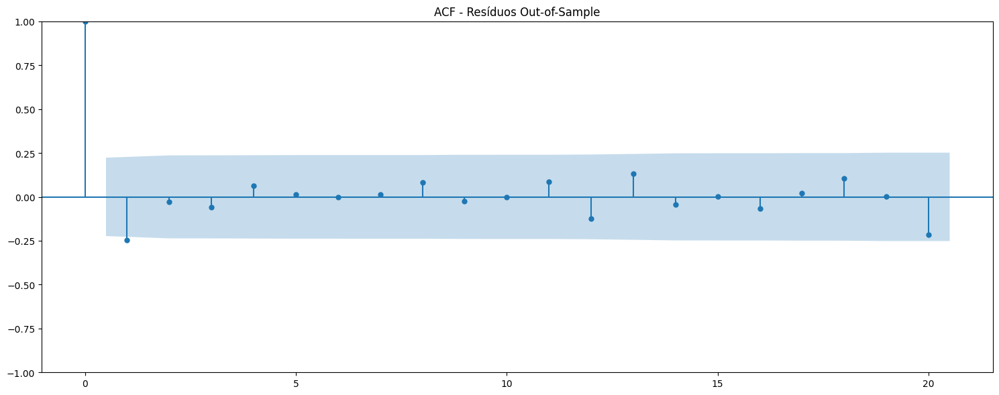


Pipeline finalizado!
Tempo total de execução: 4.73 minutos


In [12]:
resultado_sarima_1_1_1 = rodar_modelo_arima(y_train, y_test, order=(1,1,1), seasonal_order=(2, 0, 2, 6), nome_modelo="SARIMA(1,1,1)(2,0,2)[6]")


Rodando SARIMA(3,1,1)(2,0,2)[6] com order=(3, 1, 1) seasonal_order=(2, 0, 2, 6)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


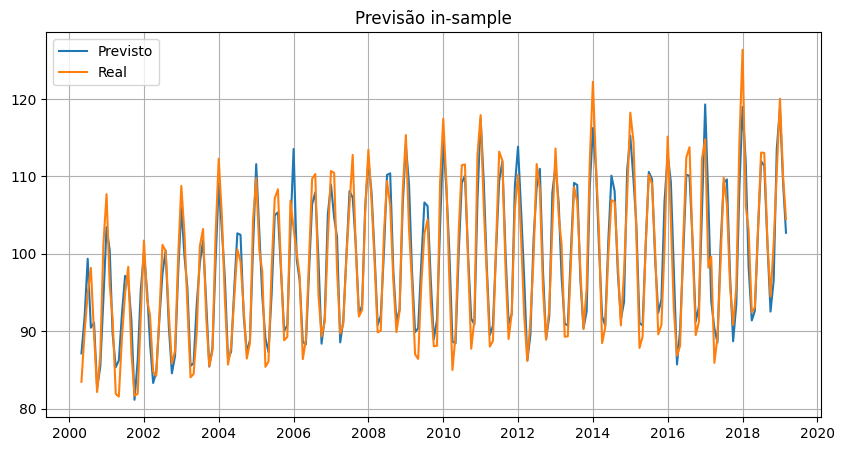


Etapa 3 - Análise de Resíduos In-Sample


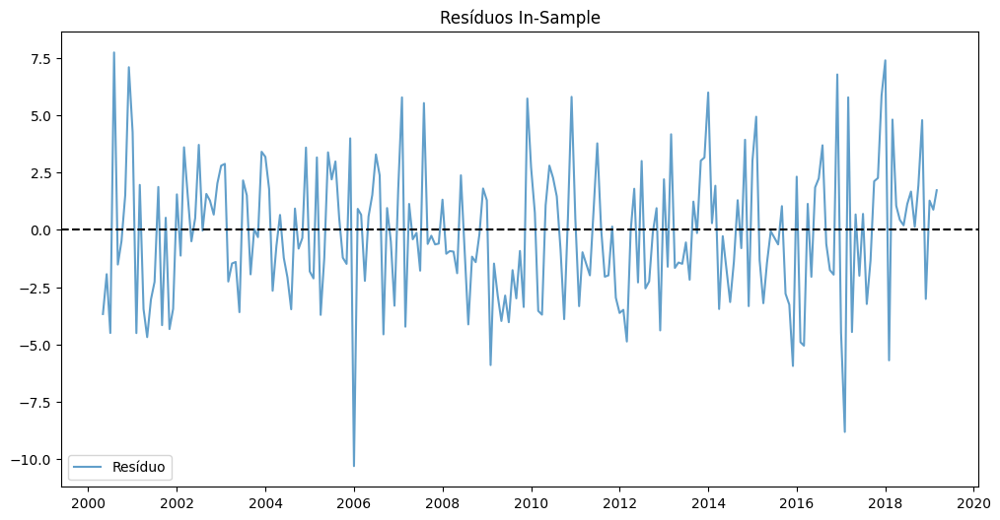

Média: -0.2053, Desvio-padrão: 2.9482

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=5.0050, p-valor=0.8908 → Sem autocorrelação
Lag 20: estatística=17.3527, p-valor=0.6300 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

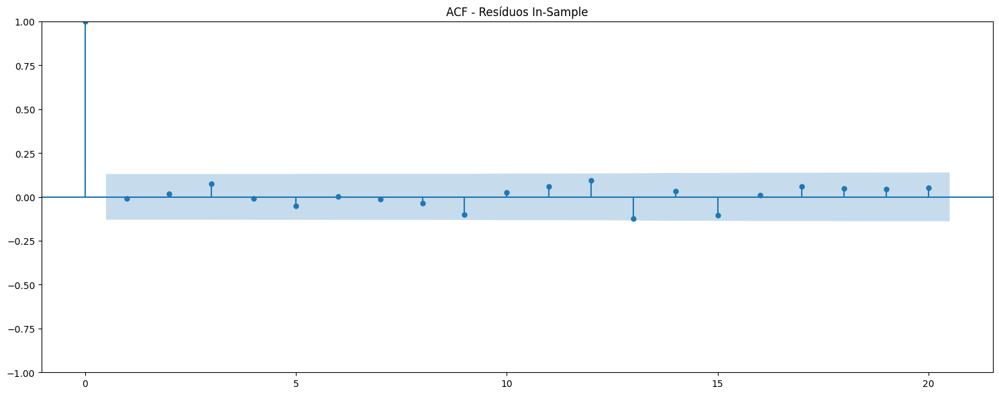


Etapa 4 - Previsões Out-of-Sample


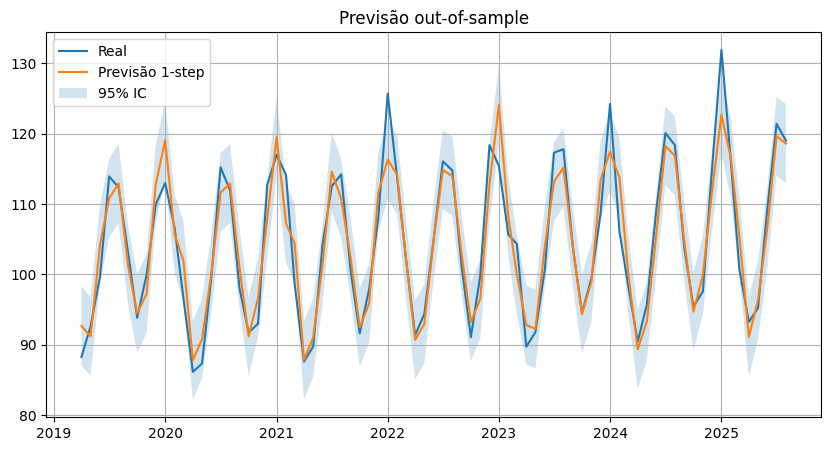


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 2.6966
MAPE: 0.0253
MSE: 12.0432

Etapa 6 - Análise de Resíduos Out-of-Sample


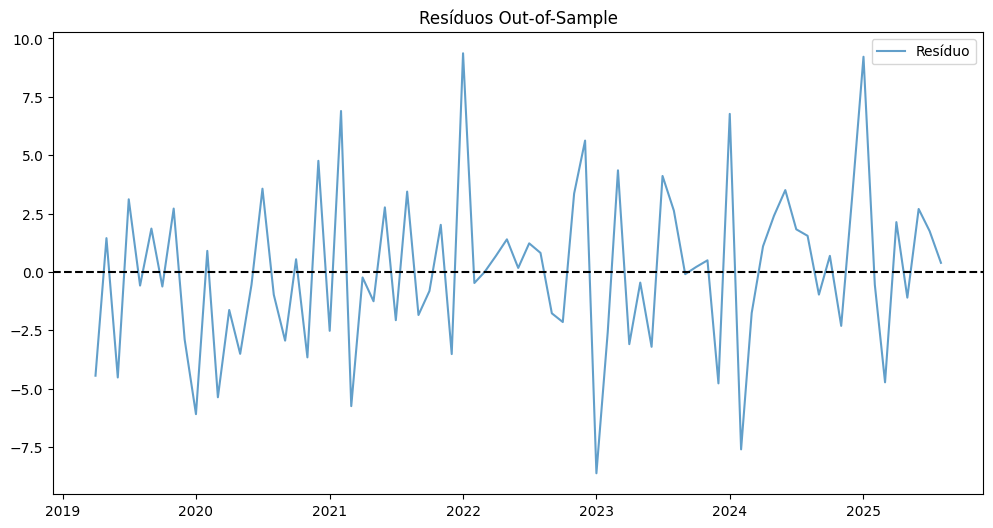

Média: 0.0526, Desvio-padrão: 3.4927

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=7.4462, p-valor=0.6828 → Sem autocorrelação
Lag 20: estatística=18.2698, p-valor=0.5696 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

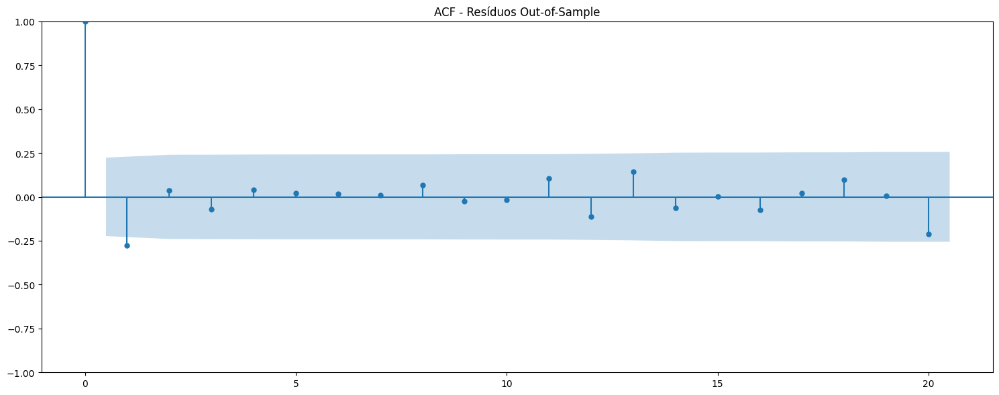


Pipeline finalizado!
Tempo total de execução: 7.12 minutos


In [13]:
resultado_sarima_3_1_1 = rodar_modelo_arima(y_train, y_test, order=(3,1,1), seasonal_order=(2, 0, 2, 6), nome_modelo="SARIMA(3,1,1)(2,0,2)[6]")


# **6. Remover componentes de Tendência e de Sazonalidade**

O objetivo aqui seria tornar a série **estacionária**, de modo que seja possível utilizar modelos clássicos como **AR**, **MA** e  **ARMA**.
- Os modelos  **AR**, **MA** e  **ARMA** só funcionam bem se a série já for estacionária.
    - Como muitas séries do mundo real têm tendência e sazonalidade, precisamos primeiro aplicar diferenciação.
- O **ARIMA** incorpora esse passo no próprio modelo (parâmetro d).

In [14]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Reaproveita suas funções
from backend.arima_model import treinar_modelo_arima, plot_forecast_com_intervalo
from backend.evaluation import calcular_metricas_erro, print_metricas_erro
from backend.residuals import diagnostico_residuos, plot_acf_residuos, plot_residuos
from backend.stats_tests import teste_adf  # opcional: imprime resumo ADF


# =========================
#    TRANSFORMERS
# =========================
class BaseTransformer:
    def fit(self, y: pd.Series):
        self.is_fitted_ = True
        self.freq_ = getattr(y.index, "freq", None) or pd.infer_freq(y.index)
        return self
    def transform(self, y: pd.Series) -> pd.Series: ...
    def inverse_one_step(self, y_hist: pd.Series, yhat_stat: float) -> float: ...
    def name(self) -> str: return self.__class__.__name__


class MovingAverageTrend(BaseTransformer):
    """Estacionária = y - média móvel (trailing)."""
    def __init__(self, window: int = 6, center: bool = False):
        self.window = window
        self.center = center  # use False para evitar vazamento

    def fit(self, y): 
        super().fit(y)
        return self

    def transform(self, y):
        trend = y.rolling(self.window, center=self.center).mean()
        return (y - trend).dropna()

    def _trend_from_hist(self, y_hist: pd.Series) -> float:
        if len(y_hist) < self.window:
            raise ValueError("Histórico insuficiente para a janela da MM.")
        return float(y_hist.tail(self.window).mean())

    def inverse_one_step(self, y_hist, yhat_stat):
        trend_t = self._trend_from_hist(y_hist)
        return trend_t + float(yhat_stat)

    def name(self): return f"MM(window={self.window})"


class EWMTrend(BaseTransformer):
    """Estacionária = y - média exponencialmente ponderada (trailing)."""
    def __init__(self, alpha: float = 0.3, adjust: bool = False):
        self.alpha = alpha
        self.adjust = adjust

    def fit(self, y): 
        super().fit(y)
        return self

    def transform(self, y):
        trend = y.ewm(alpha=self.alpha, adjust=self.adjust).mean()
        return (y - trend).dropna()

    def _trend_from_hist(self, y_hist: pd.Series) -> float:
        return float(y_hist.ewm(alpha=self.alpha, adjust=self.adjust).mean().iloc[-1])

    def inverse_one_step(self, y_hist, yhat_stat):
        trend_t = self._trend_from_hist(y_hist)
        return trend_t + float(yhat_stat)

    def name(self): return f"EWM(alpha={self.alpha})"


class Differencer(BaseTransformer):
    """
    Diferença regular (d) e/ou sazonal (D,m). A inversão 1-step usa âncoras do histórico.
    """
    def __init__(self, d: int = 1, D: int = 0, m: int = 0):
        self.d, self.D, self.m = d, D, m

    def fit(self, y):
        super().fit(y)
        return self

    def transform(self, y):
        z = y.copy()
        for _ in range(self.D):
            z = z.diff(self.m)
        for _ in range(self.d):
            z = z.diff()
        return z.dropna()

    def inverse_one_step(self, y_hist: pd.Series, yhat_stat: float) -> float:
        val = float(yhat_stat)
        # inverte diferenças regulares
        last = y_hist.iloc[-1]
        for _ in range(self.d):
            val = last + val
            last = val
        # inverte diferenças sazonais
        for _ in range(self.D):
            if len(y_hist) < self.m:
                raise ValueError("Histórico insuficiente para inverter diferença sazonal.")
            val = y_hist.iloc[-self.m] + val
        return float(val)

    def name(self):
        parts = []
        if self.d: parts.append(f"d={self.d}")
        if self.D and self.m: parts.append(f"D={self.D},m={self.m}")
        return "Diff(" + (",".join(parts) if parts else "none") + ")"


# =========================
#    HELPERS
# =========================
def _transform_sem_vazamento(transformer, y_train: pd.Series, y_test: pd.Series) -> tuple[pd.Series, pd.Series]:
    """
    Gera série estacionária de treino e teste SEM olhar o futuro do teste.
    """
    transformer.fit(y_train)
    y_stat_train = transformer.transform(y_train)

    buf = pd.concat([y_train, y_test])
    y_stat_full = transformer.transform(buf)
    y_stat_test = y_stat_full.loc[y_test.index]

    return y_stat_train, y_stat_test


def _needed_hist_len(transformer: BaseTransformer) -> int:
    """
    Número mínimo de observações no histórico para reconstrução 1-step.
    """
    need = 1
    if isinstance(transformer, MovingAverageTrend):
        need = max(need, transformer.window)
    if isinstance(transformer, Differencer) and transformer.D and transformer.m:
        need = max(need, transformer.m)
    return need


def _init_hist_for_first_t(y_train: pd.Series, first_t, transformer: BaseTransformer) -> pd.Series:
    """
    Histórico inicial até t-1 com tamanho suficiente para a reconstrução 1-step.
    """
    need = _needed_hist_len(transformer)
    # tudo até t-1
    hist_candidate = y_train.loc[:first_t].iloc[:-1].copy()
    if len(hist_candidate) >= need:
        return hist_candidate.tail(need)
    # fallback: pegue os primeiros 'need' pontos do treino (transform.dropna() já garante que existe)
    return y_train.iloc[:need].copy()


def _plot_in_sample_original(y_train: pd.Series, yhat_in: pd.Series, titulo="Previsão in-sample"):
    idx = y_train.index.intersection(yhat_in.index)
    plt.figure(figsize=(10, 5))
    plt.plot(idx, yhat_in.loc[idx], label="Previsto")
    plt.plot(idx, y_train.loc[idx], label="Real")
    plt.title(titulo)
    plt.legend(); plt.grid(True); plt.show()


# =========================
#    PIPELINE
# =========================
def rodar_modelo_arima_transformado(
    y: pd.Series,
    transformer: BaseTransformer,
    order=(1, 0, 0),
    seasonal_order=(0, 0, 0, 0),
    pct_treino: float = 0.8,
    usar_observado_para_hist: bool = True,
    nome_modelo: str | None = None
):
    """
    Etapas (prints compatíveis com seu pipeline original):

    1) Estacionarização (fit/transform) sem vazamento + ADF opcional
    2) Treinamento do ARIMA na série estacionária
    3) Previsões In-Sample (rolling, 1-step) na escala ORIGINAL + diagnósticos
    4) Previsões Out-of-Sample (rolling, 1-step) na escala ORIGINAL + IC
    5) Avaliação de Métricas (escala original)
    6) Diagnóstico de Resíduos Out-of-Sample
    """
    inicio = time.time()
    nome = nome_modelo or f"ARIMA sobre {transformer.name()}"

    # Split na série original
    n_train = int(len(y) * pct_treino)
    y_train = y.iloc[:n_train].astype(float)
    y_test  = y.iloc[n_train:].astype(float)

    print("="*80)
    print(f"Rodando {nome} com order={order} seasonal_order={seasonal_order}")
    print(f"Transformer: {transformer.name()} | Treino: {len(y_train)} | Teste: {len(y_test)}")
    print("="*80)

    # ---------------- Etapa 1 ----------------
    print("\nEtapa 1 - Estacionarização (fit/transform)")
    y_stat_train, y_stat_test = _transform_sem_vazamento(transformer, y_train, y_test)
    print(f"Série estacionária gerada: treino={len(y_stat_train)}, teste={len(y_stat_test)}")

    print("\nTeste ADF na série estacionária (treino):")
    teste_adf(y_stat_train)  # opcional (imprime resultado)

    # ---------------- Etapa 2 ----------------
    print("\nEtapa 2 - Treinamento do Modelo (ARIMA na estacionária)")
    modelo = treinar_modelo_arima(y_stat_train, order=order, seasonal_order=seasonal_order)

    # ---------------- Etapa 3 ----------------
    print("\nEtapa 3 - Previsões In-Sample (escala original) e diagnóstico")
    yhat_in_vals = []
    # histórico inicial apenas até t0-1 (sem vazamento) e com tamanho mínimo adequado
    t0 = y_stat_train.index[0]
    hist = _init_hist_for_first_t(y_train, t0, transformer)

    for t in y_stat_train.index:
        # previsão 1-step na estacionária
        rhat_t = modelo.predict(n_periods=1)[0]
        # reconstrução na escala original usando APENAS o histórico até t-1
        yhat_t = transformer.inverse_one_step(hist, rhat_t)
        yhat_in_vals.append(yhat_t)

        # atualiza o ARIMA com o valor observado NA ESTACIONÁRIA
        modelo.update(y_stat_train.loc[t])

        # alimenta o histórico (por padrão, com o OBSERVADO do original)
        hist.loc[t] = y_train.loc[t] if usar_observado_para_hist else yhat_t

    yhat_in = pd.Series(yhat_in_vals, index=y_stat_train.index)

    _plot_in_sample_original(y_train, yhat_in, "Previsão in-sample")

    # resíduos in-sample (escala original)
    resid_in = (y_train.loc[yhat_in.index] - yhat_in)
    plot_residuos(resid_in, "Resíduos In-Sample")
    diagnostico_residuos(resid_in)
    plot_acf_residuos(resid_in, "Resíduos In-Sample")

    # ---------------- Etapa 4 ----------------
    print("\nEtapa 4 - Previsões Out-of-Sample (1-step, escala original)")
    yhat_out_vals, confs = [], []
    for t in y_stat_test.index:
        fc, ci = modelo.predict(n_periods=1, return_conf_int=True, alpha=0.05)
        rhat_t = fc[0]
        rlo_t, rhi_t = ci[0]

        yhat_t = transformer.inverse_one_step(hist, rhat_t)
        lo_t   = transformer.inverse_one_step(hist, rlo_t)
        hi_t   = transformer.inverse_one_step(hist, rhi_t)

        yhat_out_vals.append(yhat_t)
        confs.append((lo_t, hi_t))

        # update com OBSERVADO na estacionária
        modelo.update(y_stat_test.loc[t])

        # histórico: por padrão usa observado do original (1-step honesto)
        hist.loc[t] = y_test.loc[t] if usar_observado_para_hist else yhat_t

    yhat_out = pd.Series(yhat_out_vals, index=y_stat_test.index)
    confs = np.asarray(confs)

    # mesmo padrão de plot do seu pipeline original
    plot_forecast_com_intervalo(yhat_out.values, confs, y_test)

    # ---------------- Etapa 5 ----------------
    print("\nEtapa 5 - Avaliação de Métricas (escala original)")
    metricas = calcular_metricas_erro(y_test, yhat_out)
    print_metricas_erro(metricas)

    # ---------------- Etapa 6 ----------------
    print("\nEtapa 6 - Análise de Resíduos Out-of-Sample")
    resid_out = (y_test - yhat_out)
    plot_residuos(resid_out, "Resíduos Out-of-Sample")
    diagnostico_residuos(resid_out)
    plot_acf_residuos(resid_out, "Resíduos Out-of-Sample")

    fim = time.time()
    duracao_segundos = fim - inicio
    duracao_minutos = duracao_segundos / 60

    print("\nPipeline finalizado!")
    print(f"Tempo total de execução: {duracao_minutos:.2f} minutos")
    print("="*80)

    return {
        "modelo_estacionario": modelo,
        "transformer": transformer.name(),
        "metricas": metricas,
        "residuos_in": resid_in,
        "residuos_out": resid_out,
        "yhat_in": yhat_in,
        "yhat_out": yhat_out,
        "confs_out": confs,
        "tempo_execucao_minutos": duracao_minutos
    }


## **3.1. Suavização por Média Móvel**

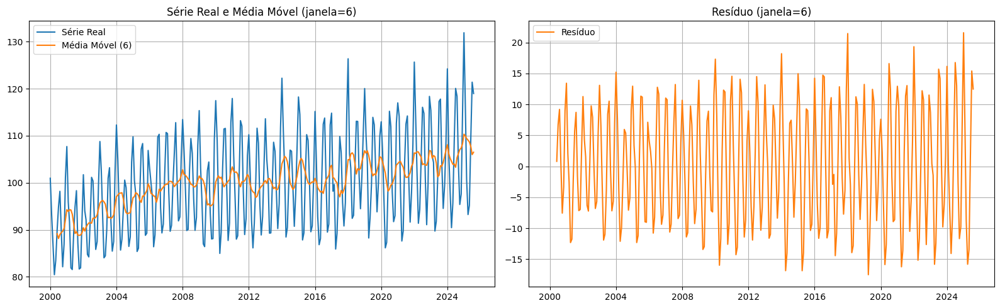

In [16]:
window = 6

mm, res_mm = calc_residuo_mm(df_2000_to_2025[coluna_numerica], window=window, center=False)
plot_mm_e_residuo(df_2000_to_2025[coluna_numerica], mm, res_mm, window=window)

In [17]:
resultado = teste_adf(res_mm)


Série é estacionária (p-valor=0.0000)
ADF Statistic: -6.669210594113763
Critical Values:
	1%: -3.453
	5%: -2.872
	10%: -2.572


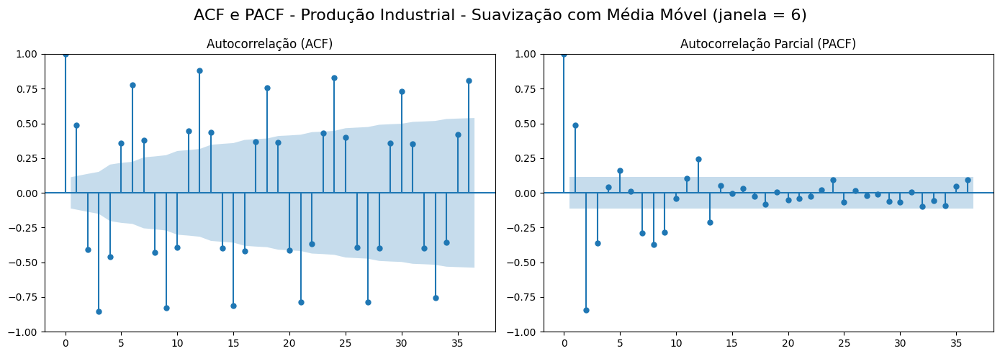

In [18]:
plot_acf_pacf(res_mm, lags=36, title=f"ACF e PACF - Produção Industrial - Suavização com Média Móvel (janela = {window})")

Após aplicar a suavização, devemos verificar duas coisas:
1. **Se o resíduo é estacionário**: necessário para aplicar modelos como **AR**, **MA**, **ARMA**, **ARIMA**, **SARIMA**.
2. **Se o resíduo é um ruído I.I.D.** (independente e identicamente distribuído): nesse caso, **não há mais estrutura a modelar**.

Se a série **não é estacionária**, pode-se aplicar outra suavização ou usar modelos que **não exigem estacionariedade**.

No exemplo acima, os resíduos das janelas 3 e 12:
- são **estacionários** (p-valores < 0.05);
- **não são ruído I.I.D.** (há lags com autocorrelação significativa).

<span style="color:#FFD700;">**Conclusão**</span>: os resíduos ainda contêm padrão
- Podem ser modelados com ARIMA, por exemplo.

Rodando ARIMA sobre MM com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)
Transformer: MM(window=6) | Treino: 231 | Teste: 77

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=226, teste=77

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0001)
ADF Statistic: -4.783340899072564
Critical Values:
	1%: -3.462
	5%: -2.875
	10%: -2.574

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


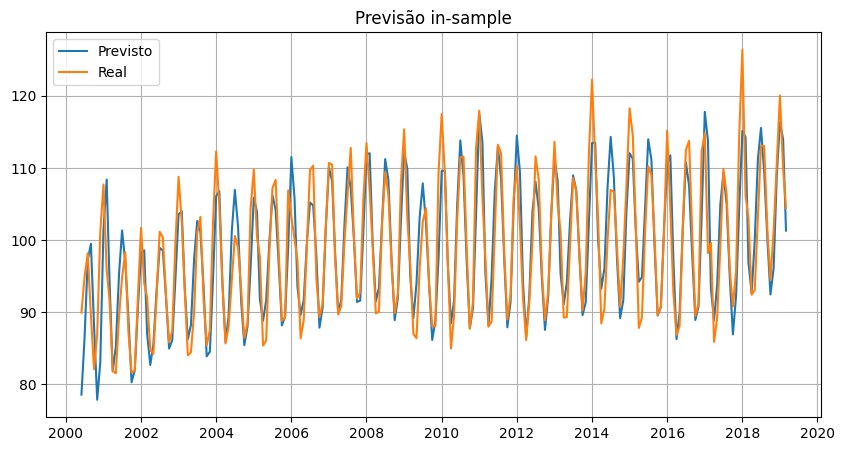

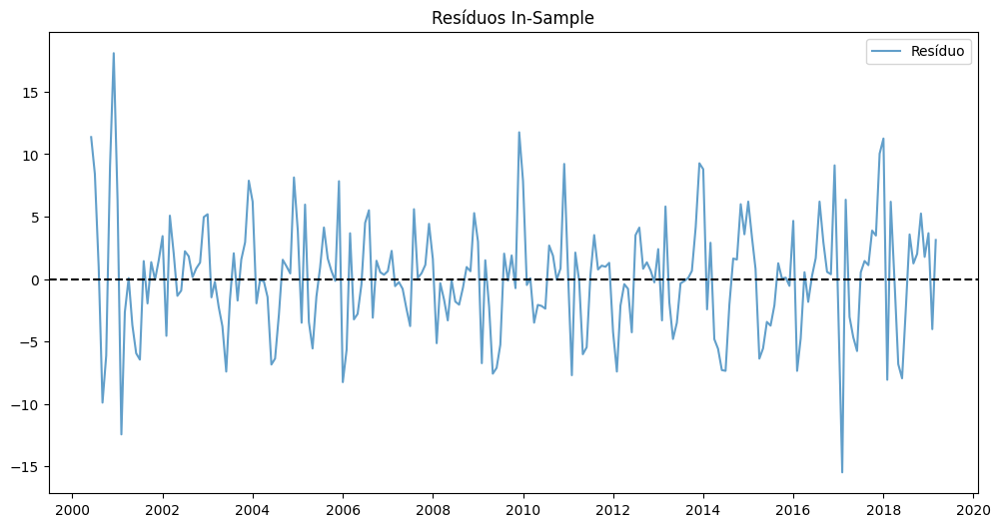

Média: 0.0875, Desvio-padrão: 4.5745

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=75.0983, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=131.9517, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

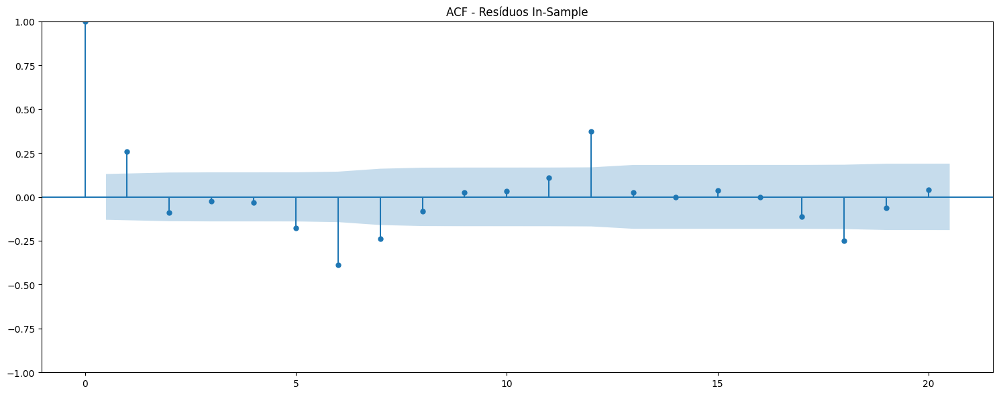


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


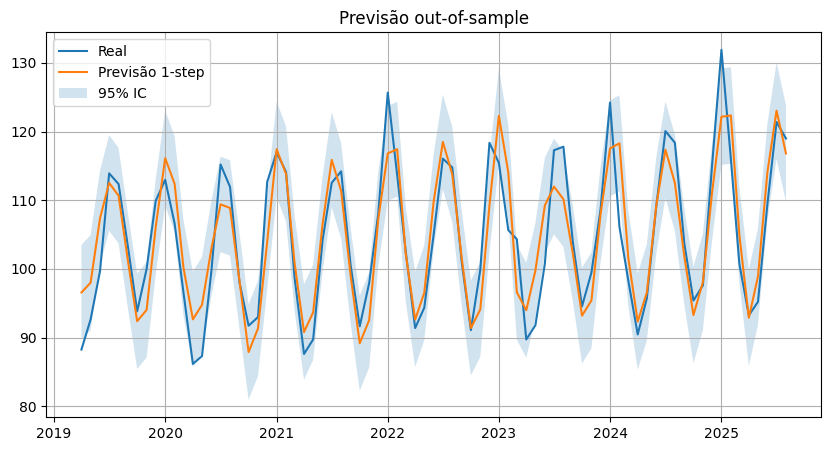


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 3.8811
MAPE: 0.0371
MSE: 22.9460

Etapa 6 - Análise de Resíduos Out-of-Sample


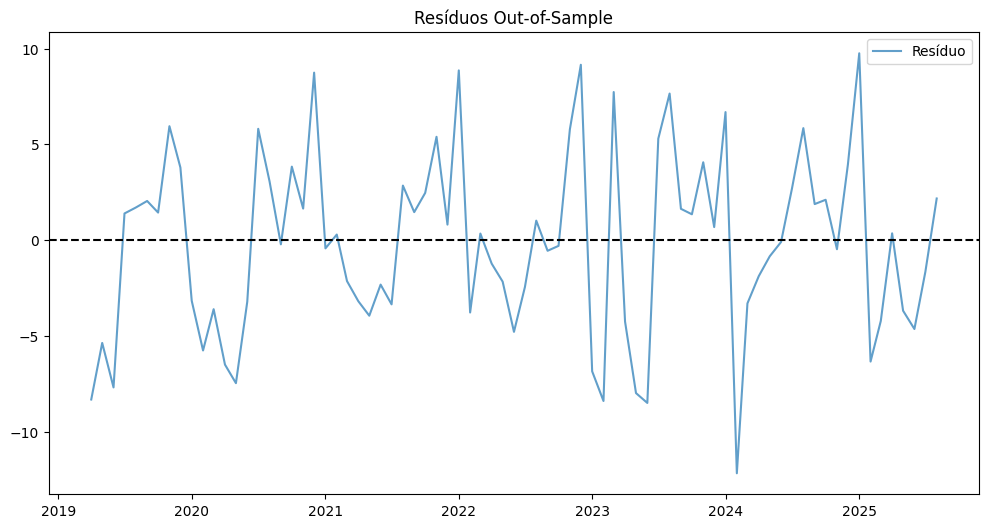

Média: -0.2011, Desvio-padrão: 4.8174

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=40.5807, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=83.5705, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

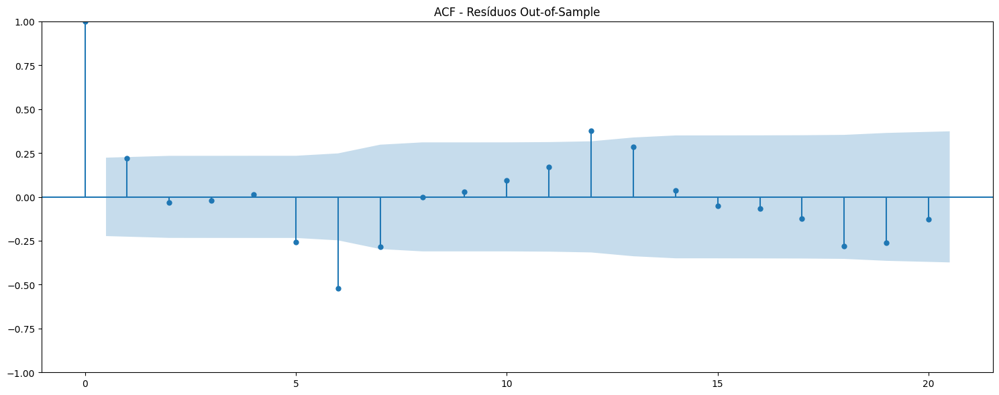


Pipeline finalizado!
Tempo total de execução: 1.16 minutos


In [19]:
res_mm = rodar_modelo_arima_transformado(
    y=df_2000_to_2025[coluna_numerica],
    transformer=MovingAverageTrend(window=6),
    order=(2,0,2), seasonal_order=(0,0,0,0),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre MM"
)

## **3.2. Suavização Exponencial**

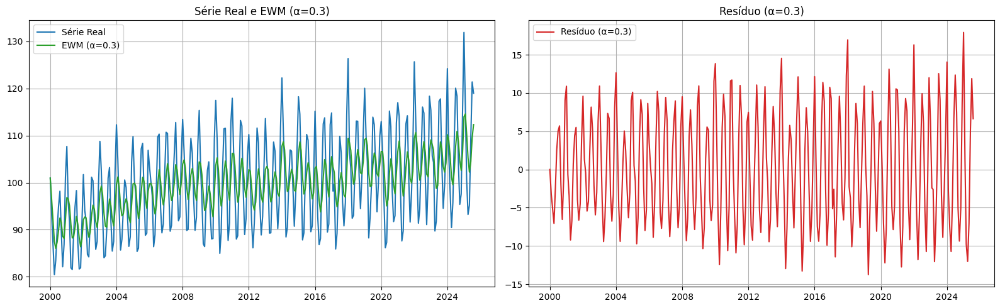

In [20]:
alpha = 0.3
ewm, res_ewm = calc_residuo_ewm(df_2000_to_2025[coluna_numerica], alpha=alpha)
plot_ewm_e_residuo(df_2000_to_2025[coluna_numerica], ewm, res_ewm, alpha=alpha)

In [21]:
resultado = teste_adf(res_ewm)

Série é estacionária (p-valor=0.0000)
ADF Statistic: -5.972761140440578
Critical Values:
	1%: -3.453
	5%: -2.871
	10%: -2.572


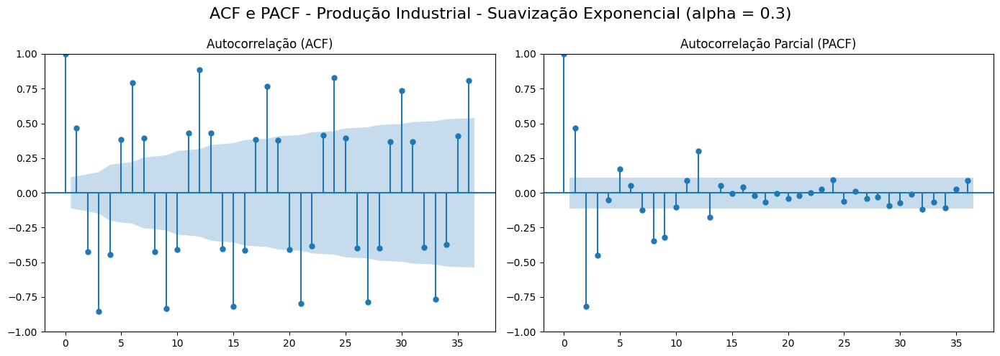

In [22]:
plot_acf_pacf(res_ewm, lags=36, title=f"ACF e PACF - Produção Industrial - Suavização Exponencial (alpha = {alpha})")

Rodando ARIMA sobre EWM com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)
Transformer: EWM(alpha=0.3) | Treino: 231 | Teste: 77

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=231, teste=77

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0002)
ADF Statistic: -4.500441514697027
Critical Values:
	1%: -3.461
	5%: -2.875
	10%: -2.574

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


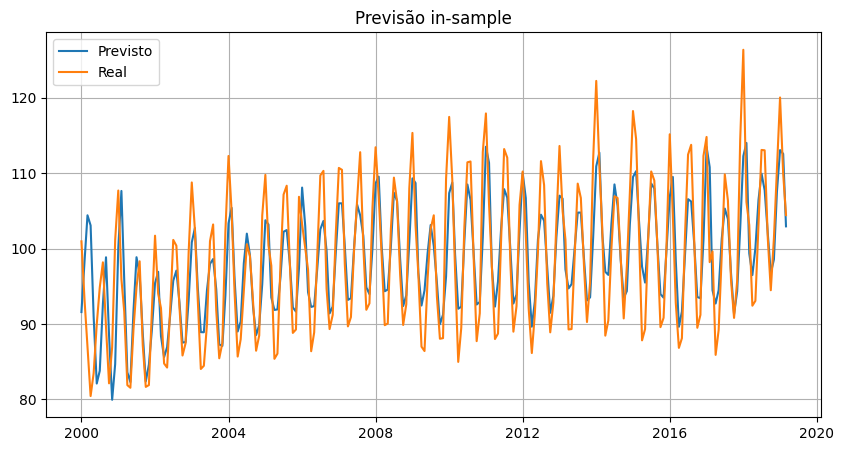

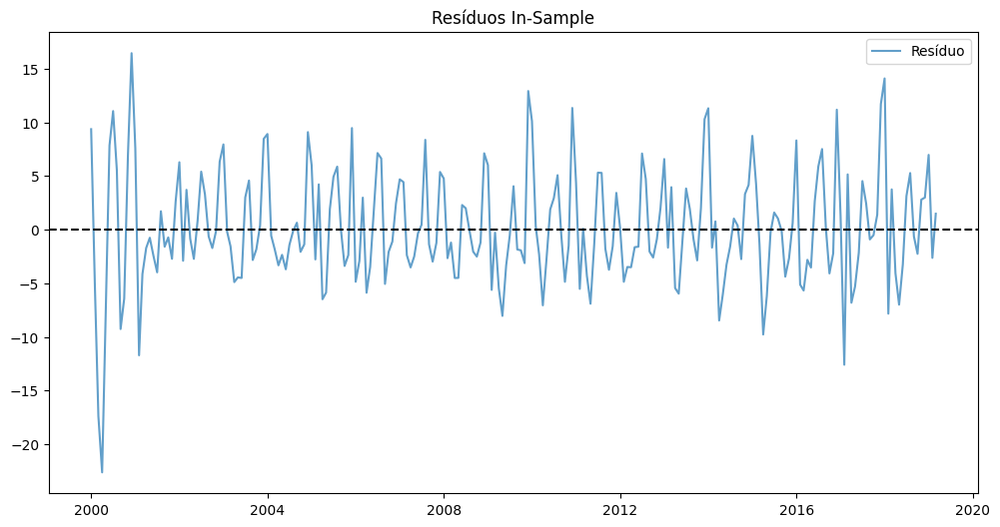

Média: 0.1039, Desvio-padrão: 5.3367

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=117.1409, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=220.8554, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

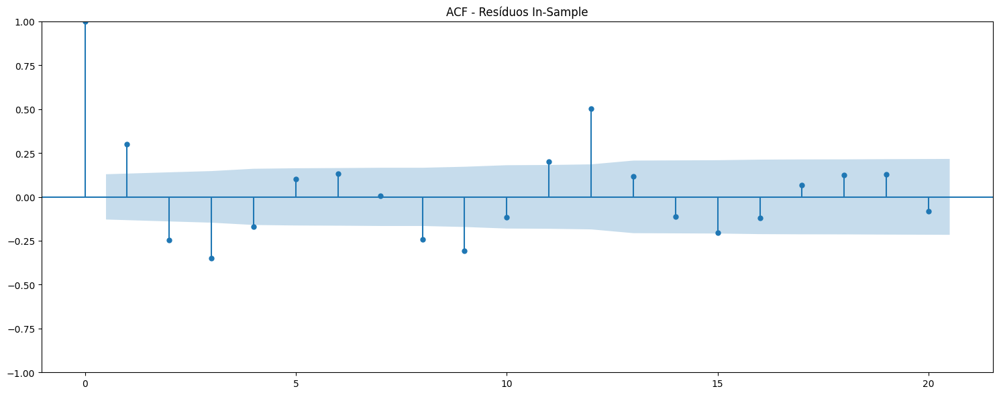


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


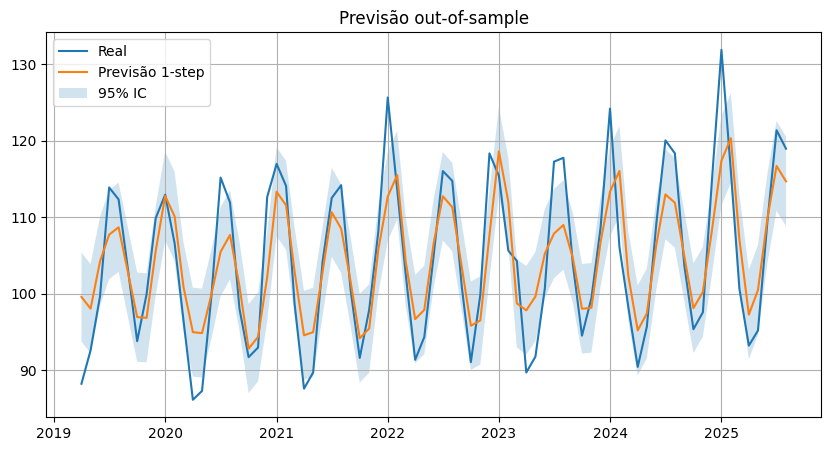


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 4.6464
MAPE: 0.0443
MSE: 31.4625

Etapa 6 - Análise de Resíduos Out-of-Sample


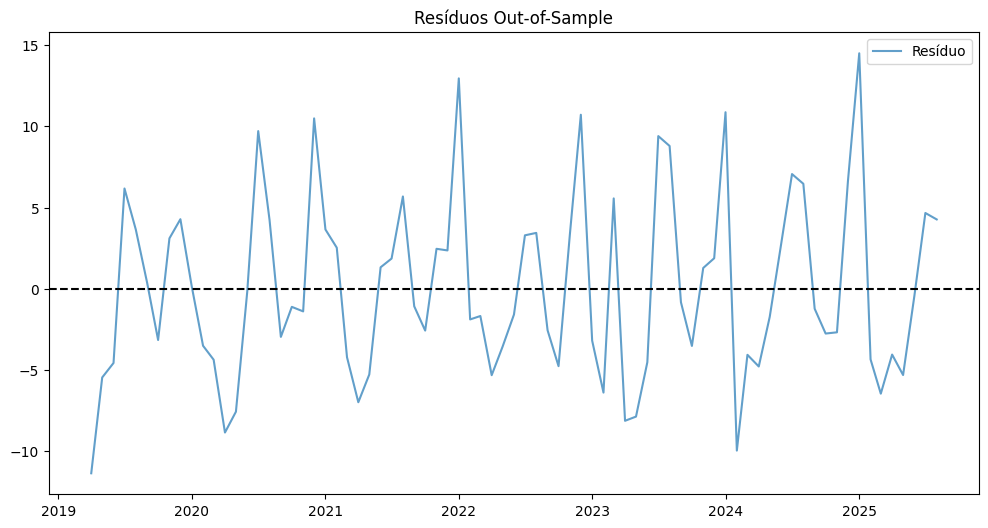

Média: 0.0249, Desvio-padrão: 5.6459

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=38.6771, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=103.5780, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

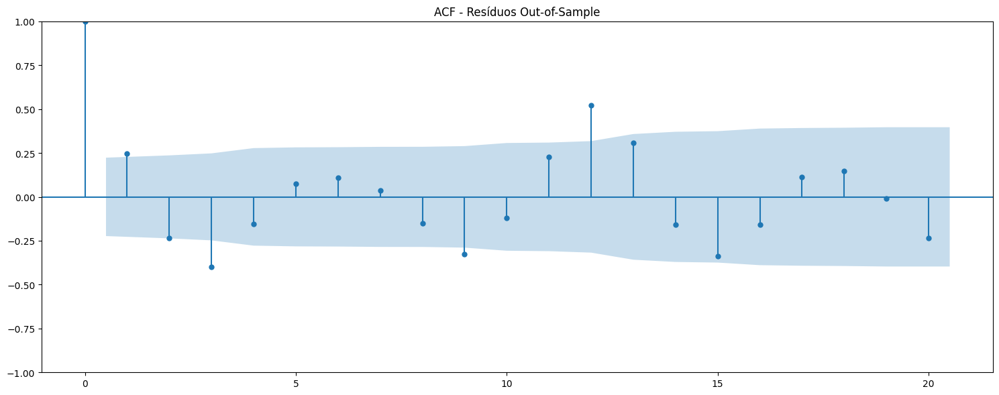


Pipeline finalizado!
Tempo total de execução: 1.13 minutos


In [23]:
res_ewm = rodar_modelo_arima_transformado(
    y=df_2000_to_2025[coluna_numerica],
    transformer=EWMTrend(alpha=0.3),
    order=(2,0,2), seasonal_order=(0,0,0,0),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre EWM"
)

### **3.1.4. Eliminação de Tendência por Diferenciação**

In [24]:
df

,IPG2211A2N
observation_date,
1939-01-01,3.3336
1939-02-01,3.3591
1939-03-01,3.4354
1939-04-01,3.4608
1939-05-01,3.4608
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


In [25]:
df.diff(1)

,IPG2211A2N
observation_date,
1939-01-01,NaN
1939-02-01,0.0255
1939-03-01,0.0763
1939-04-01,0.0254
1939-05-01,0.0000
...,...
2025-04-01,-7.4291
2025-05-01,1.9710
2025-06-01,14.2441


Rodando ARIMA sobre Diff(1) com order=(3, 0, 1) seasonal_order=(2, 0, 2, 6)
Transformer: Diff(d=1) | Treino: 231 | Teste: 77

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=230, teste=77

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0000)
ADF Statistic: -5.871738742908732
Critical Values:
	1%: -3.461
	5%: -2.875
	10%: -2.574

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


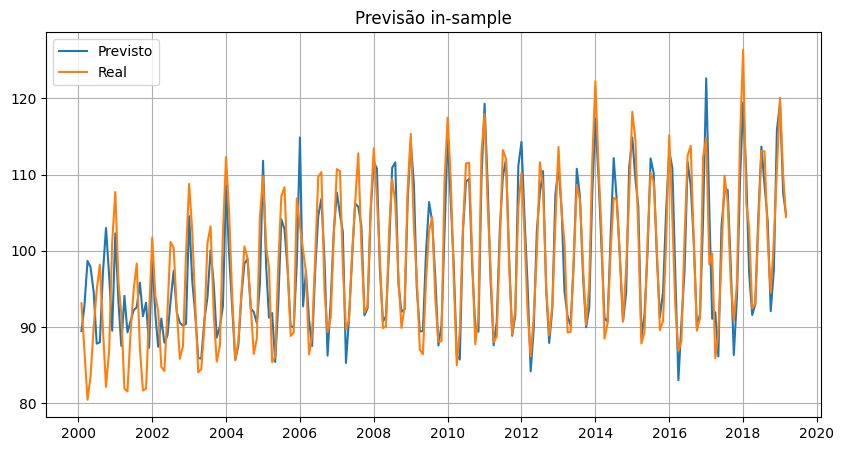

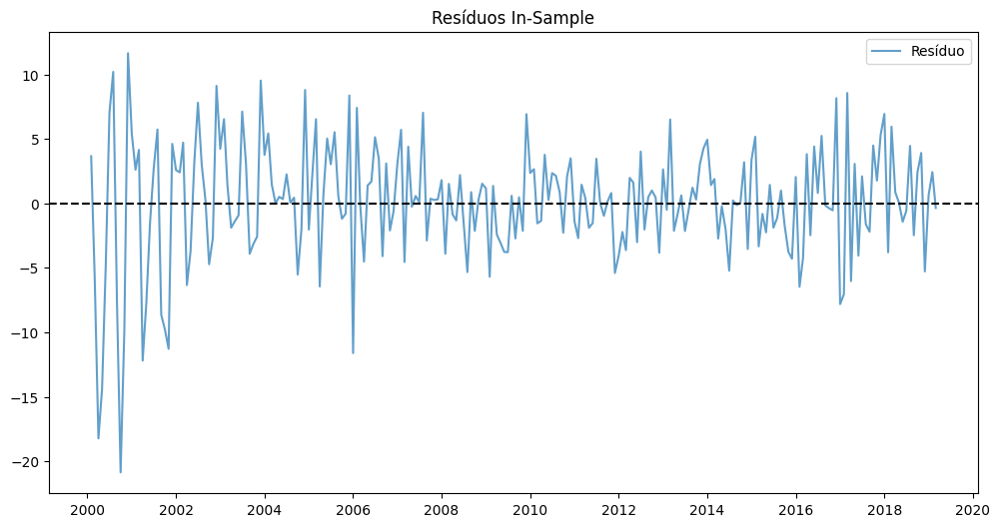

Média: 0.0490, Desvio-padrão: 4.6002

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=78.8629, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=149.7382, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

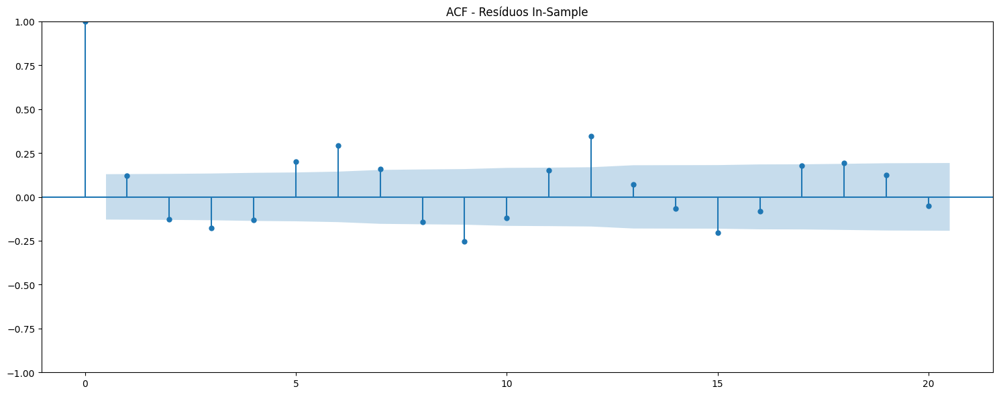


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


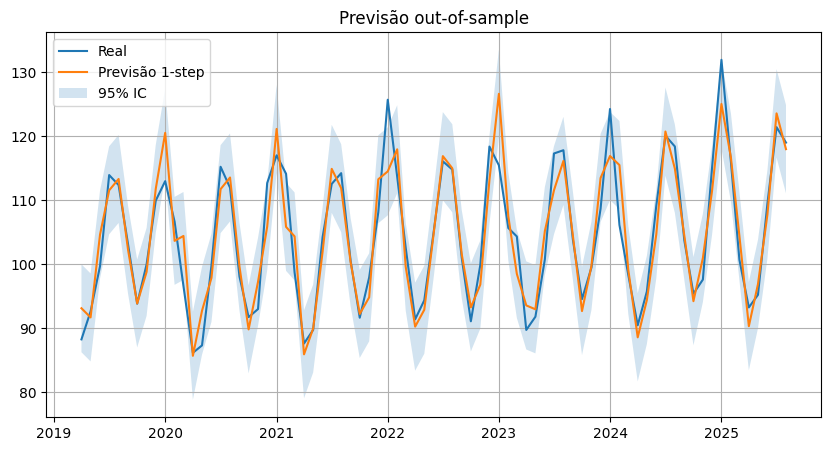


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 3.0541
MAPE: 0.0287
MSE: 15.9158

Etapa 6 - Análise de Resíduos Out-of-Sample


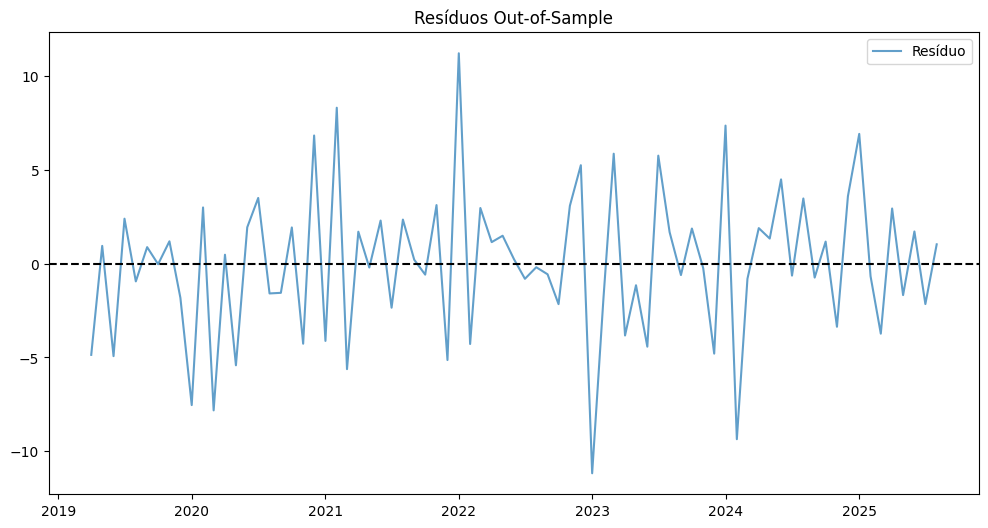

Média: -0.0125, Desvio-padrão: 4.0156

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=21.9044, p-valor=0.0156 → Autocorrelação detectada
Lag 20: estatística=37.2671, p-valor=0.0109 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

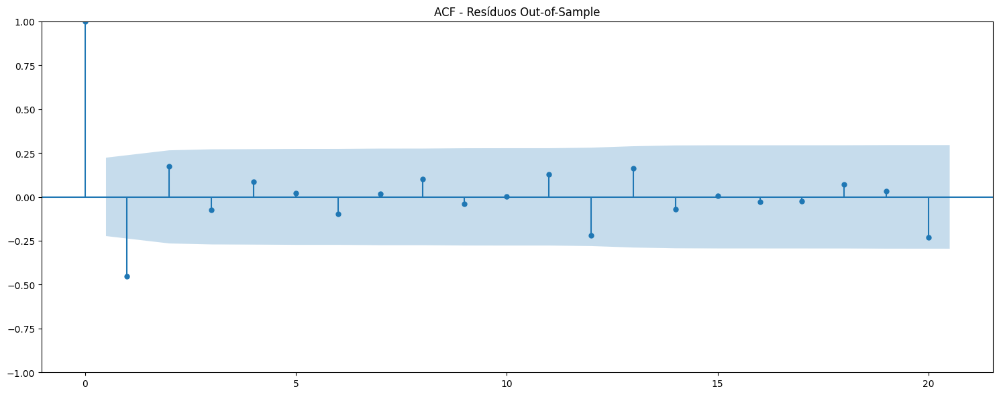


Pipeline finalizado!
Tempo total de execução: 10.37 minutos


In [26]:
# 3) Diferença “por fora do ARIMA”
res_diff = rodar_modelo_arima_transformado(
    y=df_2000_to_2025[coluna_numerica],
    transformer=Differencer(d=1, D=0, m=0),
    order=(3,0,1), seasonal_order=(2,0,2,6),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre Diff(1)"
)